In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashionpedia/instances_attributes_train2020.json
/kaggle/input/fashionpedia/instances_attributes_val2020.json
/kaggle/input/fashionpedia/val_test2020/test/165d068e46d8eaa97392d5db91620721.jpg
/kaggle/input/fashionpedia/val_test2020/test/b1dfbc0da1055c82a599e6bb777bdb81.jpg
/kaggle/input/fashionpedia/val_test2020/test/e79958a7625419a99dfc40935ad3ae6e.jpg
/kaggle/input/fashionpedia/val_test2020/test/5a90282a3570b920d4e28f0de0a71df4.jpg
/kaggle/input/fashionpedia/val_test2020/test/dd4525a10b6110df29f0a6b19e6b924b.jpg
/kaggle/input/fashionpedia/val_test2020/test/a2b9272493f4264d9a8878a8ab8d847d.jpg
/kaggle/input/fashionpedia/val_test2020/test/19dd339879e0b1efdda6a92bbd2c754d.jpg
/kaggle/input/fashionpedia/val_test2020/test/d5da50f251cc2ba7d90e5ab8251d2b94.jpg
/kaggle/input/fashionpedia/val_test2020/test/1c1484bd95e170ad133660f8a69419b1.jpg
/kaggle/input/fashionpedia/val_test2020/test/e14733841b04c64e75789a91fbe549b3.jpg
/kaggle/input/fashionpedia/val_test2020/test/d76083cc75d

In [2]:
!pip install git+https://github.com/openai/CLIP.git
!pip install ftfy regex tqdm
!pip install qdrant-client==1.7.3
!pip install -U bitsandbytes accelerate transformers --quiet
!pip install transformers

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-t8oc8e7n
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-t8oc8e7n
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.4 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=fbaa3532e440f3458eed61a16590f6ee8e530c34d571279b9077e2c5fad8c7ed
  Stored in directory: /tmp/pip-ephem-wheel-cache-klfzuld6/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.3/206.3 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 74.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 108.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.3/323.3 kB

In [3]:
"""
Complete Configuration - Run this first
"""
from pathlib import Path
import torch

# Paths
BASE_DIR = Path("/kaggle/input/fashionpedia")
TRAIN_IMG_DIR = BASE_DIR / "train2020/train"
TEST_IMG_DIR = BASE_DIR / "val_test2020/test"
TRAIN_ANNOTATIONS = BASE_DIR / "instances_attributes_train2020.json"
VAL_ANNOTATIONS = BASE_DIR / "instances_attributes_val2020.json"

OUTPUT_DIR = Path("/kaggle/working")
PROCESSED_DATA_DIR = OUTPUT_DIR / "processed_data"
EMBEDDINGS_DIR = OUTPUT_DIR / "embeddings"
VECTOR_DB_DIR = OUTPUT_DIR / "vector_db"

for dir_path in [PROCESSED_DATA_DIR, EMBEDDINGS_DIR, VECTOR_DB_DIR]:
    dir_path.mkdir(parents=True, exist_ok=True)

# Model Config
CLIP_MODEL_NAME = "ViT-L/14"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
FLORENCE_MODEL_ID = "microsoft/Florence-2-large"

# Taxonomy
CLOTHING_CATEGORIES = [
    "shirt", "blouse", "t-shirt", "tank top", "sweater", "cardigan", 
    "hoodie", "sweatshirt", "blazer", "jacket", "coat", "vest",
    "pants", "jeans", "trousers", "shorts", "skirt", "leggings",
    "dress", "jumpsuit", "romper", "overall", "suit", "tuxedo",
    "raincoat", "windbreaker", "parka", "trench coat", "puffer jacket",
    "scarf", "hat", "cap", "belt", "tie", "bow tie", "glasses", "sunglasses",
    "shoe", "shoes", "sneakers", "boots"
]

COLORS = [
    "red", "blue", "green", "yellow", "orange", "purple", "pink",
    "black", "white", "gray", "brown", "beige", "navy", "maroon",
    "teal", "olive", "cream", "tan", "khaki", "burgundy", "cyan",
    "bright", "dark", "light", "pastel", "gold", "silver"
]

SCENE_CONTEXTS = [
    "office", "home", "indoor", "room", "building", "cafe", "restaurant",
    "store", "mall", "gym", "studio", "bedroom", "living room",
    "outdoor", "street", "park", "beach", "garden", "urban", "city",
    "countryside", "mountain", "forest", "field",
    "party", "wedding", "conference", "casual setting", "formal setting"
]

STYLE_ATTRIBUTES = [
    "formal", "casual", "business", "professional", "sporty", "athletic",
    "elegant", "vintage", "modern", "trendy", "classic", "bohemian",
    "streetwear", "minimalist", "preppy", "chic", "relaxed"
]

# Indexing
BATCH_SIZE = 32
MAX_IMAGES = None
MIN_IMAGE_SIZE = 224
MAX_IMAGE_SIZE = 1024

ATTRIBUTE_WEIGHTS = {
    'global': 0.15,
    'clothing': 0.35,
    'color': 0.25,
    'scene': 0.25
}

VECTOR_DB_CONFIG = {
    'collection_name': 'fashion_images',
    'vector_size': 768,
    'distance': 'cosine',
    'hnsw_config': {'ef_construct': 100, 'm': 16}
}

PROMPT_TEMPLATES = {
    'clothing': [
        "a photo of a person wearing a {item}",
        "a {item}",
        "someone in a {item}",
        "{item} clothing"
    ],
    'color': [
        "a photo of {color} clothing",
        "{color} colored clothes",
        "a person wearing {color}",
        "{color} fashion"
    ],
    'scene': [
        "a photo taken in {scene}",
        "a photo of someone at {scene}",
        "{scene} setting",
        "background is {scene}"
    ],
    'style': [
        "{style} outfit",
        "{style} fashion style",
        "a {style} look"
    ]
}

LOG_LEVEL = "INFO"
LOG_FILE = OUTPUT_DIR / "indexing.log"

print("✓ Config loaded successfully")
print(f"  Device: {DEVICE}")
print(f"  Output directory: {OUTPUT_DIR}")

✓ Config loaded successfully
  Device: cuda
  Output directory: /kaggle/working


In [4]:
"""
Data structures and ImageMetadata class
"""
from dataclasses import dataclass
from typing import List, Optional
from pathlib import Path

@dataclass
class ImageMetadata:
    """Structured metadata for each image"""
    image_id: int
    file_name: str
    file_path: Path
    width: int
    height: int
    clothing_items: List[str]
    colors: List[str]
    attributes: List[str]
    num_people: int
    scene_context: Optional[str] = None
    style_tags: List[str] = None
    is_valid: bool = True
    florence_caption: Optional[str] = None

print("✓ Data structures defined")

✓ Data structures defined


In [5]:
import torch
from transformers import AutoModelForCausalLM, AutoProcessor
import gc
import json
import logging
from collections import defaultdict
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration (Assumed from your environment) ---
# FLORENCE_MODEL_ID = "microsoft/Florence-2-large"
# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("="*80)
print("🚀 INITIALIZING STABLE FLORENCE-2 PIPELINE")
print("="*80)

# 1. CLEANUP
def cleanup():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

cleanup()

# 2. MODEL LOADING WITH ALL FIXES
florence_model = None
florence_processor = None

try:
    print("\n[1/3] Loading Model & Processor...")
    
    florence_processor = AutoProcessor.from_pretrained(
        FLORENCE_MODEL_ID, 
        trust_remote_code=True
    )
    
    # FIX: Use 'dtype' and 'attn_implementation="eager"' to bypass SDPA error
    florence_model = AutoModelForCausalLM.from_pretrained(
        FLORENCE_MODEL_ID,
        dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
        trust_remote_code=True,
        attn_implementation="eager" 
    ).to(DEVICE)

    # FIX: Inject missing attribute if it still fails to register
    if not hasattr(florence_model, '_supports_sdpa'):
        florence_model._supports_sdpa = False

    florence_model.eval()
    print(f"  ✓ Model loaded on {DEVICE} with dtype {next(florence_model.parameters()).dtype}")

except Exception as e:
    print(f"  ✗ Critical Load Error: {e}")

# 3. ENRICHMENT FUNCTION WITH FIXES
def enrich_image_with_florence(image_path, model, processor):
    """
    Processes image with fixes for:
    1. Dtype mismatch (Input vs Model)
    2. NoneType shape error (use_cache=False)
    3. Beam search bugs (num_beams=1)
    """
    if model is None or processor is None:
        return "Model not loaded"

    try:
        image = Image.open(image_path).convert("RGB")
        prompt = "<DETAILED_CAPTION>"
        
        # Determine target device/dtype
        model_dtype = next(model.parameters()).dtype
        model_device = next(model.parameters()).device
        
        # Prepare inputs
        inputs = processor(text=prompt, images=image, return_tensors="pt")
        
        # FIX: Manual conversion of all input tensors to match model
        inputs = {k: v.to(model_device).to(model_dtype) if v.dtype.is_floating_point else v.to(model_device) 
                  for k, v in inputs.items()}
        
        with torch.no_grad():
            generated_ids = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=512,
                do_sample=False,
                num_beams=1,      # FIX: Avoid beam search bugs
                use_cache=False   # FIX: Avoid 'NoneType' has no attribute 'shape'
            )
        
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
        
        parsed_answer = processor.post_process_generation(
            generated_text, 
            task=prompt, 
            image_size=(image.width, image.height)
        )
        
        return parsed_answer.get(prompt, generated_text)

    except Exception as e:
        return f"Error: {str(e)}"

# 4. UPDATED DATA LOADER CLASS
class FashionpediaLoader:
    def __init__(self, annotation_path, image_dir, max_images=None):
        self.annotation_path = Path(annotation_path)
        self.image_dir = Path(image_dir)
        self.max_images = max_images
        
        with open(self.annotation_path, 'r') as f:
            self.coco_data = json.load(f)
        
        self.images = {img['id']: img for img in self.coco_data['images']}
        self.annotations = self.coco_data['annotations']
        self.image_to_annotations = defaultdict(list)
        for ann in self.annotations:
            self.image_to_annotations[ann['image_id']].append(ann)

    def get_all_metadata(self, model, processor):
        results = []
        image_ids = list(self.images.keys())
        if self.max_images:
            image_ids = image_ids[:self.max_images]
            
        print(f"\n[2/3] Processing {len(image_ids)} images with Florence-2...")
        
        for img_id in tqdm(image_ids):
            img_info = self.images[img_id]
            file_path = self.image_dir / img_info['file_name']
            
            # Use the enrichment helper
            caption = enrich_image_with_florence(file_path, model, processor)
            
            results.append({
                "image_id": img_id,
                "caption": caption,
                "file_name": img_info['file_name']
            })
        return results

print("\n[3/3] System Ready.")

2026-01-17 09:32:03.758848: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1768642323.949582      24 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768642324.001616      24 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1768642324.475947      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768642324.475982      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768642324.475985      24 computation_placer.cc:177] computation placer alr

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

🚀 INITIALIZING STABLE FLORENCE-2 PIPELINE

[1/3] Loading Model & Processor...


preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

model.safetensors:   0%|          | 0.00/1.55G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

  ✓ Model loaded on cuda with dtype torch.float16

[3/3] System Ready.


INDEXING

In [6]:
"""
Data Loader with FIXED Florence-2 Integration
"""
import json
import logging
from collections import defaultdict
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionpediaLoader:
    def __init__(self, annotation_path, image_dir, max_images=None):
        self.annotation_path = annotation_path
        self.image_dir = image_dir
        self.max_images = max_images
        
        logger.info(f"Loading annotations from {annotation_path}")
        with open(annotation_path, 'r') as f:
            self.coco_data = json.load(f)
        
        self._build_lookups()
        logger.info(f"Loaded {len(self.images)} images with {len(self.annotations)} annotations")
    
    def _build_lookups(self):
        self.images = {img['id']: img for img in self.coco_data['images']}
        self.categories = {cat['id']: cat for cat in self.coco_data['categories']}
        self.category_id_to_name = {cat['id']: cat['name'] for cat in self.coco_data['categories']}
        
        if 'attributes' in self.coco_data:
            self.attributes = {attr['id']: attr for attr in self.coco_data['attributes']}
            self.attribute_id_to_name = {attr['id']: attr['name'] for attr in self.coco_data['attributes']}
        else:
            self.attributes = {}
            self.attribute_id_to_name = {}
        
        self.annotations = self.coco_data['annotations']
        self.image_to_annotations = defaultdict(list)
        for ann in self.annotations:
            self.image_to_annotations[ann['image_id']].append(ann)
    
    def extract_colors_from_attributes(self, attribute_ids):
        colors = []
        for attr_id in attribute_ids:
            attr_name = self.attribute_id_to_name.get(attr_id, "").lower()
            for color in COLORS:
                if color in attr_name:
                    colors.append(color)
        return list(set(colors))
    
    def enrich_with_florence(self, metadata, model, processor):
        """FIXED Florence-2 enrichment"""
        if model is None or processor is None:
            return metadata
        
        try:
            image = Image.open(metadata.file_path).convert("RGB")
            prompt = "<DETAILED_CAPTION>"
            
            model_dtype = next(model.parameters()).dtype
            model_device = next(model.parameters()).device
            
            inputs = processor(text=prompt, images=image, return_tensors="pt")
            
            # Convert all tensors to match model dtype
            converted_inputs = {}
            for key, value in inputs.items():
                if isinstance(value, torch.Tensor):
                    value = value.to(model_device)
                    if value.dtype in [torch.float32, torch.float64, torch.float16, torch.bfloat16]:
                        value = value.to(model_dtype)
                    converted_inputs[key] = value
                else:
                    converted_inputs[key] = value
            
            # Generate with greedy decoding (no beam search)
            with torch.no_grad():
                generated_ids = model.generate(
                    input_ids=converted_inputs["input_ids"],
                    pixel_values=converted_inputs["pixel_values"],
                    max_new_tokens=512,
                    do_sample=False,
                    num_beams=1,
                    use_cache=False# CRITICAL: avoids past_key_values bug
                )
            
            generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            
            parsed = processor.post_process_generation(
                generated_text,
                task=prompt,
                image_size=(image.width, image.height)
            )
            
            caption = parsed.get(prompt, generated_text) if isinstance(parsed, dict) else str(parsed)
            metadata.florence_caption = caption
            
            if metadata.style_tags is None:
                metadata.style_tags = []
            metadata.style_tags.append(str(caption)[:100])
            
        except Exception as e:
            logger.error(f"Florence enrichment failed for {metadata.image_id}: {str(e)}")
        
        return metadata
    
    def extract_metadata(self, image_id):
        img_data = self.images[image_id]
        annotations = self.image_to_annotations[image_id]
        
        clothing_items = []
        all_attributes = []
        colors = []
        
        for ann in annotations:
            category_name = self.category_id_to_name.get(ann['category_id'], 'unknown')
            clothing_items.append(category_name)
            
            if 'attribute_ids' in ann:
                attr_ids = ann['attribute_ids']
                attributes = [self.attribute_id_to_name.get(aid, '') for aid in attr_ids]
                all_attributes.extend(attributes)
                colors.extend(self.extract_colors_from_attributes(attr_ids))
        
        clothing_items = list(set(clothing_items))
        colors = list(set(colors))
        all_attributes = list(set(all_attributes))
        
        metadata = ImageMetadata(
            image_id=image_id,
            file_name=img_data['file_name'],
            file_path=self.image_dir / img_data['file_name'],
            width=img_data['width'],
            height=img_data['height'],
            clothing_items=clothing_items,
            colors=colors,
            attributes=all_attributes,
            num_people=len(annotations),
            style_tags=[]
        )
        
        metadata.is_valid = self._validate_image(metadata)
        return metadata
    
    def _validate_image(self, metadata):
        if not metadata.file_path.exists():
            return False
        if metadata.width < MIN_IMAGE_SIZE or metadata.height < MIN_IMAGE_SIZE:
            return False
        if len(metadata.clothing_items) == 0:
            return False
        try:
            with Image.open(metadata.file_path) as img:
                img.verify()
            return True
        except:
            return False
    
    def get_all_metadata(self, florence_model=None, florence_processor=None):
        all_metadata = []
        image_ids = list(self.images.keys())
        
        if self.max_images:
            image_ids = image_ids[:self.max_images]
        
        logger.info(f"Processing {len(image_ids)} images...")
        
        for image_id in tqdm(image_ids, desc="Extracting metadata"):
            metadata = self.extract_metadata(image_id)
            if metadata.is_valid:
                if florence_model and florence_processor:
                    metadata = self.enrich_with_florence(metadata, florence_model, florence_processor)
                all_metadata.append(metadata)
        
        logger.info(f"Valid images: {len(all_metadata)} / {len(image_ids)}")
        return all_metadata
    
    def save_metadata(self, metadata_list, output_path):
        """CRITICAL METHOD - This was missing in old version!"""
        data = []
        for meta in metadata_list:
            data.append({
                'image_id': meta.image_id,
                'file_name': meta.file_name,
                'file_path': str(meta.file_path),
                'width': meta.width,
                'height': meta.height,
                'clothing_items': meta.clothing_items,
                'colors': meta.colors,
                'attributes': meta.attributes,
                'num_people': meta.num_people,
                'scene_context': meta.scene_context,
                'style_tags': meta.style_tags,
                'florence_caption': meta.florence_caption
            })
        
        with open(output_path, 'w') as f:
            json.dump(data, f, indent=2)
        logger.info(f"Saved metadata to {output_path}")
    
    def get_statistics(self, metadata_list):
        from collections import Counter
        stats = {
            'total_images': len(metadata_list),
            'clothing_distribution': dict(Counter([item for meta in metadata_list for item in meta.clothing_items]).most_common(20)),
            'color_distribution': dict(Counter([color for meta in metadata_list for color in meta.colors]).most_common(20)),
            'avg_items_per_image': sum(len(meta.clothing_items) for meta in metadata_list) / len(metadata_list) if metadata_list else 0
        }
        return stats

def load_and_preprocess_dataset(split='train', max_images=None, florence_model=None, florence_processor=None):
    """FIXED version with proper error handling"""
    if split == 'train':
        annotation_path = TRAIN_ANNOTATIONS
        image_dir = TRAIN_IMG_DIR
    else:
        annotation_path = VAL_ANNOTATIONS
        image_dir = TEST_IMG_DIR
    
    loader = FashionpediaLoader(annotation_path, image_dir, max_images)
    metadata_list = loader.get_all_metadata(florence_model, florence_processor)
    
    output_path = PROCESSED_DATA_DIR / f"{split}_metadata.json"
    loader.save_metadata(metadata_list, output_path)
    
    stats = loader.get_statistics(metadata_list)
    logger.info(f"\nDataset Statistics for {split}:")
    logger.info(f"Total images: {stats['total_images']}")
    logger.info(f"Avg items per image: {stats['avg_items_per_image']:.2f}")
    
    return metadata_list, loader

print("✓ Fixed data loader and Florence-2 loaded successfully!")
print("="*80)
print("\nNow you can run the complete pipeline in the next cell.")

✓ Fixed data loader and Florence-2 loaded successfully!

Now you can run the complete pipeline in the next cell.


In [ ]:
"""
Multi-Attribute CLIP Encoder
"""
import torch
import torch.nn.functional as F
import clip
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import logging

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class MultiAttributeCLIPEncoder:
    def __init__(self, model_name=CLIP_MODEL_NAME, device=DEVICE):
        self.device = device
        self.model_name = model_name
        
        logger.info(f"Loading CLIP model: {model_name}")
        self.model, self.preprocess = clip.load(model_name, device=device)
        self.model.eval()
        
        self._precompute_attribute_prompts()
        logger.info(f"CLIP model loaded on {device}")
    
    def _precompute_attribute_prompts(self):
        logger.info("Pre-computing attribute prompt embeddings...")
        
        with torch.no_grad():
            self.clothing_prompts = {}
            for item in tqdm(CLOTHING_CATEGORIES, desc="Encoding clothing"):
                prompts = [template.format(item=item) for template in PROMPT_TEMPLATES['clothing']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.clothing_prompts[item] = embeddings.mean(dim=0)
            
            self.color_prompts = {}
            for color in tqdm(COLORS, desc="Encoding colors"):
                prompts = [template.format(color=color) for template in PROMPT_TEMPLATES['color']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.color_prompts[color] = embeddings.mean(dim=0)
            
            self.scene_prompts = {}
            for scene in tqdm(SCENE_CONTEXTS, desc="Encoding scenes"):
                prompts = [template.format(scene=scene) for template in PROMPT_TEMPLATES['scene']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.scene_prompts[scene] = embeddings.mean(dim=0)
            
            self.style_prompts = {}
            for style in tqdm(STYLE_ATTRIBUTES, desc="Encoding styles"):
                prompts = [template.format(style=style) for template in PROMPT_TEMPLATES['style']]
                text_tokens = clip.tokenize(prompts).to(self.device)
                embeddings = self.model.encode_text(text_tokens)
                embeddings = F.normalize(embeddings, dim=-1)
                self.style_prompts[style] = embeddings.mean(dim=0)
        
        logger.info("Attribute prompt embeddings computed")
    
    def encode_image(self, image_path):
        try:
            image = Image.open(image_path).convert('RGB')
            image_input = self.preprocess(image).unsqueeze(0).to(self.device)
            
            with torch.no_grad():
                image_features = self.model.encode_image(image_input)
                image_features = F.normalize(image_features, dim=-1)
            
            return image_features.squeeze(0)
        except Exception as e:
            logger.error(f"Error encoding image {image_path}: {e}")
            return torch.zeros(768).to(self.device)
    
    def compute_attribute_embeddings(self, global_embedding, metadata):
        attribute_embeddings = {}
        
        with torch.no_grad():
            # Clothing
            clothing_items = [item for item in metadata.clothing_items if item in self.clothing_prompts]
            if clothing_items:
                clothing_embeds = torch.stack([self.clothing_prompts[item] for item in clothing_items])
                clothing_scores = (global_embedding @ clothing_embeds.T).softmax(dim=0)
                clothing_embedding = (clothing_scores.unsqueeze(1) * clothing_embeds).sum(dim=0)
            else:
                clothing_embedding = global_embedding
            attribute_embeddings['clothing'] = F.normalize(clothing_embedding, dim=-1)
            
            # Color
            colors = [color for color in metadata.colors if color in self.color_prompts]
            if colors:
                color_embeds = torch.stack([self.color_prompts[color] for color in colors])
                color_scores = (global_embedding @ color_embeds.T).softmax(dim=0)
                color_embedding = (color_scores.unsqueeze(1) * color_embeds).sum(dim=0)
            else:
                color_embedding = global_embedding
            attribute_embeddings['color'] = F.normalize(color_embedding, dim=-1)
            
            # Scene
            scene_embeds = torch.stack(list(self.scene_prompts.values()))
            scene_scores = global_embedding @ scene_embeds.T
            top_k_scenes = scene_scores.topk(k=3)
            top_scene_embeds = torch.stack([list(self.scene_prompts.values())[idx] for idx in top_k_scenes.indices])
            scene_weights = top_k_scenes.values.softmax(dim=0)
            scene_embedding = (scene_weights.unsqueeze(1) * top_scene_embeds).sum(dim=0)
            attribute_embeddings['scene'] = F.normalize(scene_embedding, dim=-1)
            
            top_scene_idx = top_k_scenes.indices[0].item()
            metadata.scene_context = list(self.scene_prompts.keys())[top_scene_idx]
            
            # Style
            style_embeds = torch.stack(list(self.style_prompts.values()))
            style_scores = global_embedding @ style_embeds.T
            top_k_styles = style_scores.topk(k=2)
            top_style_embeds = torch.stack([list(self.style_prompts.values())[idx] for idx in top_k_styles.indices])
            style_weights = top_k_styles.values.softmax(dim=0)
            style_embedding = (style_weights.unsqueeze(1) * top_style_embeds).sum(dim=0)
            attribute_embeddings['style'] = F.normalize(style_embedding, dim=-1)
            
            metadata.style_tags = [list(self.style_prompts.keys())[idx.item()] for idx in top_k_styles.indices]
        
        return attribute_embeddings
    
    def encode_image_with_attributes(self, metadata):
        global_embedding = self.encode_image(metadata.file_path)
        attribute_embeddings = self.compute_attribute_embeddings(global_embedding, metadata)
        
        embeddings = {
            'global': global_embedding.cpu().numpy(),
            'clothing': attribute_embeddings['clothing'].cpu().numpy(),
            'color': attribute_embeddings['color'].cpu().numpy(),
            'scene': attribute_embeddings['scene'].cpu().numpy(),
            'style': attribute_embeddings['style'].cpu().numpy()
        }
        return embeddings
    
    def encode_batch(self, metadata_list, batch_size=BATCH_SIZE):
        all_embeddings = []
        logger.info(f"Encoding {len(metadata_list)} images in batches of {batch_size}")
        
        for i in tqdm(range(0, len(metadata_list), batch_size), desc="Encoding images"):
            batch = metadata_list[i:i + batch_size]
            for metadata in batch:
                try:
                    embeddings = self.encode_image_with_attributes(metadata)
                    all_embeddings.append(embeddings)
                except Exception as e:
                    logger.error(f"Error encoding {metadata.file_name}: {e}")
                    dummy = np.zeros(768)
                    all_embeddings.append({
                        'global': dummy, 'clothing': dummy, 'color': dummy, 'scene': dummy, 'style': dummy
                    })
        return all_embeddings
    
    def save_embeddings(self, embeddings_list, output_path):
        logger.info(f"Saving embeddings to {output_path}")
        np.save(output_path, embeddings_list)

print("✓ CLIP encoder defined")

✓ CLIP encoder defined


In [8]:
"""
Vector Database Manager using Qdrant
"""
import logging
from typing import Dict, List, Optional, Tuple
from pathlib import Path
import json
import numpy as np
from qdrant_client import QdrantClient
from qdrant_client.models import (
    Distance, VectorParams, PointStruct, Filter, 
    FieldCondition, MatchValue, SearchParams
)

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionVectorDB:
    def __init__(self, path: Optional[Path] = None):
        if path is None:
            path = VECTOR_DB_DIR
        
        self.path = path
        self.client = QdrantClient(path=str(path))
        self.collection_name = VECTOR_DB_CONFIG['collection_name']
        logger.info(f"Initialized vector DB at {path}")
    
    def create_collection(self, recreate: bool = False):
        collections = self.client.get_collections().collections
        exists = any(c.name == self.collection_name for c in collections)
        
        if exists and recreate:
            logger.info(f"Deleting existing collection: {self.collection_name}")
            self.client.delete_collection(self.collection_name)
            exists = False
        
        if not exists:
            logger.info(f"Creating collection: {self.collection_name}")
            self.client.create_collection(
                collection_name=self.collection_name,
                vectors_config={
                    "global": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "clothing": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "color": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "scene": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE),
                    "style": VectorParams(size=VECTOR_DB_CONFIG['vector_size'], distance=Distance.COSINE)
                },
                hnsw_config=VECTOR_DB_CONFIG['hnsw_config']
            )
            logger.info("Collection created successfully")
        else:
            logger.info(f"Collection {self.collection_name} already exists")
    
    def upsert_images(self, metadata_list: List, embeddings_list: List, batch_size: int = 100):
        if len(metadata_list) != len(embeddings_list):
            raise ValueError("Metadata and embeddings lists must have same length")
        
        logger.info(f"Upserting {len(metadata_list)} images to vector DB")
        
        points = []
        for idx, (metadata, embeddings) in enumerate(zip(metadata_list, embeddings_list)):
            point = PointStruct(
                id=metadata.image_id,
                vector={
                    "global": embeddings['global'].tolist(),
                    "clothing": embeddings['clothing'].tolist(),
                    "color": embeddings['color'].tolist(),
                    "scene": embeddings['scene'].tolist(),
                    "style": embeddings['style'].tolist()
                },
                payload={
                    "image_id": metadata.image_id,
                    "file_name": metadata.file_name,
                    "file_path": str(metadata.file_path),
                    "width": metadata.width,
                    "height": metadata.height,
                    "clothing_items": metadata.clothing_items,
                    "colors": metadata.colors,
                    "attributes": metadata.attributes,
                    "num_people": metadata.num_people,
                    "scene_context": metadata.scene_context,
                    "style_tags": metadata.style_tags if metadata.style_tags else []
                }
            )
            points.append(point)
        
        for i in range(0, len(points), batch_size):
            batch = points[i:i + batch_size]
            self.client.upsert(collection_name=self.collection_name, points=batch)
        
        logger.info(f"Successfully upserted {len(points)} points")
    
    def search(self, query_vector: np.ndarray, vector_name: str = "global", limit: int = 10, 
               filter_conditions: Optional[Filter] = None, score_threshold: Optional[float] = None):
        search_params = SearchParams(hnsw_ef=128, exact=False)
        
        results = self.client.search(
            collection_name=self.collection_name,
            query_vector=(vector_name, query_vector.tolist()),
            limit=limit,
            query_filter=filter_conditions,
            score_threshold=score_threshold,
            search_params=search_params,
            with_payload=True
        )
        
        return [(r.id, r.score, r.payload) for r in results]
    
    def multi_vector_search(self, query_vectors: Dict[str, np.ndarray], weights: Optional[Dict[str, float]] = None,
                           limit: int = 50, filter_conditions: Optional[Filter] = None):
        if weights is None:
            weights = ATTRIBUTE_WEIGHTS
        
        all_candidates = {}
        
        for attr_name, query_vec in query_vectors.items():
            if attr_name not in weights:
                continue
            
            results = self.search(query_vector=query_vec, vector_name=attr_name, limit=limit,
                                filter_conditions=filter_conditions)
            
            for image_id, score, payload in results:
                if image_id not in all_candidates:
                    all_candidates[image_id] = {'scores': {}, 'payload': payload}
                all_candidates[image_id]['scores'][attr_name] = score * weights[attr_name]
        
        final_results = []
        for image_id, data in all_candidates.items():
            final_score = sum(data['scores'].values())
            final_results.append((image_id, final_score, data['payload']))
        
        final_results.sort(key=lambda x: x[1], reverse=True)
        return final_results
    
    def get_collection_info(self):
        info = self.client.get_collection(self.collection_name)
        return {'points_count': info.points_count, 'status': str(info.status)}
    
    def clear_collection(self):
        logger.warning(f"Clearing all data from collection: {self.collection_name}")
        self.client.delete_collection(self.collection_name)
        self.create_collection()

def build_index(metadata_list, embeddings_list, recreate: bool = False):
    logger.info("Building vector database index")
    db = FashionVectorDB()
    db.create_collection(recreate=recreate)
    db.upsert_images(metadata_list, embeddings_list)
    info = db.get_collection_info()
    logger.info(f"Index built: {info['points_count']} images indexed")
    return db

print("✓ Vector database defined")

✓ Vector database defined


RETRIEVAL

In [9]:
"""
ADVANCED FIXED Query Parser
Improvements:
1. Synonym Mapping (e.g., crimson -> red)
2. Phrase-based extraction (prevents breaking "light blue")
3. Dynamic Florence-2 Weighting for descriptive queries
"""
import re
from typing import Dict, List, Optional, Tuple
from dataclasses import dataclass, asdict

@dataclass
class ParsedQuery:
    raw_query: str
    clothing_items: List[str]
    colors: List[str]
    color_bindings: List[Tuple[str, str]]
    scene: Optional[str]
    style: Optional[str]
    formality: Optional[str]
    count: Optional[int]
    is_descriptive: bool = False # Flag for long, natural language queries
    
    def to_dict(self):
        return asdict(self)

class QueryParser:
    """Robust regex-based query parser with synonym and phrase support"""
    
    def __init__(self):
        # --- SYNONYM MAPPING ---
        self.color_map = {
            'crimson': 'red', 'scarlet': 'red', 'burgundy': 'red',
            'navy': 'blue', 'azure': 'blue', 'teal': 'blue',
            'emerald': 'green', 'olive': 'green', 'lime': 'green',
            'charcoal': 'black', 'ebony': 'black',
            'ivory': 'white', 'cream': 'white'
        }
        
        # Original vocabs (keeping your globals)
        self.clothing_vocab = set(item.lower() for item in CLOTHING_CATEGORIES)
        self.color_vocab = set(color.lower() for color in COLORS) | set(self.color_map.keys())
        self.scene_vocab = set(scene.lower() for scene in SCENE_CONTEXTS)
        self.style_vocab = set(style.lower() for style in STYLE_ATTRIBUTES)
        
        self.formal_keywords = {'formal', 'professional', 'business', 'suit', 'tie', 'blazer'}
        self.casual_keywords = {'casual', 'relaxed', 'informal', 'everyday', 'weekend'}
        
        self._compile_patterns()
    
    def _compile_patterns(self):
        # Compositional pattern (extended for synonyms)
        self.compositional_pattern = re.compile(
            r'(\w+)\s+(shirt|pants|jacket|dress|coat|top|blouse|skirt|shoes?|tie|hat|jeans|shorts|sweater|hoodie)\s+(?:and|with)\s+(\w+)\s+(shirt|pants|jacket|dress|coat|top|blouse|skirt|shoes?|tie|hat|jeans|shorts|sweater|hoodie)',
            re.IGNORECASE
        )
        self.location_pattern = re.compile(
            r'(?:at|in|inside|outside|on)\s+(?:a|an|the)?\s*(\w+(?:\s+\w+)?)',
            re.IGNORECASE
        )

    def _canonical_color(self, color: str) -> str:
        """Maps a synonym to a base color (crimson -> red)"""
        return self.color_map.get(color.lower(), color.lower())

    def create_search_texts(self, parsed: ParsedQuery) -> Dict[str, str]:
        """Converts parsed attributes into descriptive strings for CLIP encoding"""
        search_texts = {'global': parsed.raw_query}
        
        # Clothing text
        if parsed.clothing_items:
            search_texts['clothing'] = f"a photo of a person wearing {', '.join(parsed.clothing_items)}"
        else:
            search_texts['clothing'] = parsed.raw_query
        
        # Color text with binding logic
        if parsed.colors:
            if parsed.color_bindings:
                color_text = " and ".join([f"{color} {item}" for color, item in parsed.color_bindings])
                search_texts['color'] = f"a photo of {color_text}"
            else:
                search_texts['color'] = f"a photo of {', '.join(parsed.colors)} clothing"
        else:
            search_texts['color'] = parsed.raw_query
        
        # Scene text
        search_texts['scene'] = f"a photo taken in {parsed.scene}" if parsed.scene else parsed.raw_query
        
        # Style text
        if parsed.style:
            search_texts['style'] = f"{parsed.style} fashion"
        elif parsed.formality:
            search_texts['style'] = f"{parsed.formality} outfit"
        else:
            search_texts['style'] = parsed.raw_query
        
        # Florence text (defaults to raw query, used as fallback)
        search_texts['florence'] = parsed.raw_query
        
        return search_texts

    def parse(self, query: str) -> ParsedQuery:
        query_lower = query.lower()
        # Mark as descriptive if query is long (uses Florence weights later)
        is_descriptive = len(query_lower.split()) > 7
        
        result = ParsedQuery(query, [], [], [], None, None, None, None, is_descriptive)
        
        # 1. PHRASE-BASED EXTRACTION (Check for multi-word style/scene first)
        for scene in sorted(self.scene_vocab, key=len, reverse=True):
            if scene in query_lower:
                result.scene = scene
                break

        # 2. Compositional pattern
        comp_match = self.compositional_pattern.search(query_lower)
        if comp_match:
            c1, item1, c2, item2 = comp_match.groups()
            for c, i in [(c1, item1), (c2, item2)]:
                base_c = self._canonical_color(c)
                if base_c in self.color_vocab:
                    result.colors.append(base_c)
                    result.color_bindings.append((base_c, i))
                if i in self.clothing_vocab and i not in result.clothing_items:
                    result.clothing_items.append(i)

        # 3. Extract all clothing items (boundary-aware)
        for item in self.clothing_vocab:
            if re.search(rf'\b{item}s?\b', query_lower):
                if item not in result.clothing_items:
                    result.clothing_items.append(item)
        
        # 4. Extract all colors with Synonym Support
        for color in self.color_vocab:
            if re.search(rf'\b{color}\b', query_lower):
                base_c = self._canonical_color(color)
                if base_c not in result.colors:
                    result.colors.append(base_c)
        
        # 5. Formality & Style
        if any(kw in query_lower for kw in self.formal_keywords):
            result.formality = 'formal'
        elif any(kw in query_lower for kw in self.casual_keywords):
            result.formality = 'casual'

        for style in self.style_vocab:
            if re.search(rf'\b{style}\b', query_lower):
                result.style = style
                break

        # 6. Final Simple Binding
        if len(result.colors) == 1 and len(result.clothing_items) == 1 and not result.color_bindings:
            result.color_bindings.append((result.colors[0], result.clothing_items[0]))
        
        return result

    def get_dynamic_weights(self, parsed: ParsedQuery) -> Dict[str, float]:
        """Determine weights with FLORENCE-2 integration for descriptive queries"""
        
        # BASE WEIGHTS
        weights = {'global': 0.20, 'clothing': 0.30, 'color': 0.20, 'scene': 0.15, 'style': 0.05, 'florence': 0.10}

        # Case 1: Long descriptive query (Descriptive Florence Boost)
        if parsed.is_descriptive:
            return {'global': 0.10, 'clothing': 0.15, 'color': 0.15, 'scene': 0.10, 'style': 0.05, 'florence': 0.45}

        # Case 2: Specific color bindings (Color Vector Boost)
        if len(parsed.color_bindings) >= 1:
            return {'global': 0.10, 'clothing': 0.20, 'color': 0.50, 'scene': 0.10, 'style': 0.05, 'florence': 0.05}
        
        # Case 3: Scene focused
        if parsed.scene and not parsed.colors:
            return {'global': 0.15, 'clothing': 0.15, 'color': 0.10, 'scene': 0.50, 'style': 0.05, 'florence': 0.05}
        
        return weights

print("✓ Advanced Query parser defined with Synonym and Florence support")

✓ Advanced Query parser defined with Synonym and Florence support


In [10]:
"""
Cross-Encoder Reranker for precise ranking
"""
import logging

logging.basicConfig(level=LOG_LEVEL)
logger = logging.getLogger(__name__)

class FashionReranker:
    def __init__(self, model_name='cross-encoder/ms-marco-MiniLM-L-6-v2'):
        try:
            from sentence_transformers import CrossEncoder
            
            print(f"Loading Re-ranker ({model_name})...")
            self.model = CrossEncoder(model_name, device=DEVICE)
            self.active = True
            print("✓ Re-ranker loaded successfully")
            
        except ImportError:
            print("⚠️ Cross-encoder disabled. Install with: !pip install sentence-transformers")
            self.active = False
        except Exception as e:
            print(f"⚠️ Re-ranker failed to load: {e}")
            self.active = False
    
    def rerank(self, query: str, candidates: List[Dict], top_k: int = 10) -> List[Dict]:
        if not self.active or not candidates:
            return candidates[:top_k]
        
        pairs = []
        for cand in candidates:
            desc_parts = []
            
            if cand.get('clothing_items'):
                items = ', '.join(cand['clothing_items'][:5])
                desc_parts.append(f"person wearing {items}")
            
            if cand.get('colors'):
                colors = ', '.join(cand['colors'][:3])
                desc_parts.append(f"in {colors} colors")
            
            if cand.get('scene'):
                desc_parts.append(f"at {cand['scene']}")
            
            if cand.get('styles'):
                styles = ', '.join(cand['styles'][:2])
                desc_parts.append(f"with {styles} style")
            
            description = ". ".join(desc_parts) if desc_parts else "a fashion photograph"
            pairs.append([query, description])
        
        try:
            scores = self.model.predict(pairs)
            
            for i, cand in enumerate(candidates):
                cand['rerank_score'] = float(scores[i])
                cand['original_score'] = cand.get('score', 0.0)
                cand['score'] = float(scores[i])
            
            reranked = sorted(candidates, key=lambda x: x['score'], reverse=True)
            return reranked[:top_k]
            
        except Exception as e:
            print(f"⚠️ Reranking failed: {e}")
            return candidates[:top_k]

print("✓ Reranker defined")

✓ Reranker defined


In [11]:
"""
Advanced Fashion Retriever - Updated Complete System
With all methods needed for dual caption system
"""
import logging
import time
from typing import Dict, List, Optional, Tuple
from pathlib import Path
import torch
import torch.nn.functional as F
import clip
import numpy as np

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

class AdvancedFashionRetriever:
    def __init__(self, db_path: Optional[Path] = None, device: str = DEVICE, use_reranking: bool = True):
        logger.info("="*80)
        logger.info("INITIALIZING ADVANCED FASHION RETRIEVER")
        logger.info("="*80)
        
        self.device = device
        self.use_reranking = use_reranking
        
        # Use ImprovedQueryParser if available, otherwise QueryParser
        try:
            self.query_parser = ImprovedQueryParser()
            logger.info("✓ Improved Query Parser initialized")
        except:
            self.query_parser = QueryParser()
            logger.info("✓ Query Parser initialized")
        
        logger.info(f"Loading CLIP model on {device}...")
        self.clip_model, self.clip_preprocess = clip.load(CLIP_MODEL_NAME, device=device)
        self.clip_model.eval()
        logger.info("✓ CLIP model loaded")
        
        self.encoder = MultiAttributeCLIPEncoder(device=device)
        logger.info("✓ Multi-attribute encoder ready")
        
        self.db_path = db_path if db_path else VECTOR_DB_DIR
        self.db = FashionVectorDB(path=self.db_path)
        logger.info(f"✓ Connected to vector database: {self.db_path}")
        
        if use_reranking:
            try:
                self.reranker = ImprovedFashionReranker()
            except:
                try:
                    self.reranker = FashionReranker()
                except:
                    self.reranker = None
                    logger.info("⚠️ Reranking disabled")
        else:
            self.reranker = None
            logger.info("⚠️ Reranking disabled")
        
        logger.info("="*80)
        logger.info("✓ ADVANCED RETRIEVER READY")
        logger.info("="*80)
    
    def encode_query(self, query_text: str) -> torch.Tensor:
        text_tokens = clip.tokenize([query_text]).to(self.device)
        with torch.no_grad():
            text_features = self.clip_model.encode_text(text_tokens)
            text_features = F.normalize(text_features, dim=-1)
        return text_features[0]
    
    def encode_query_attributes(self, parsed_query) -> Dict[str, np.ndarray]:
        search_texts = self.query_parser.create_search_texts(parsed_query)
        
        embeddings = {}
        with torch.no_grad():
            for attr_name, text in search_texts.items():
                text_tokens = clip.tokenize([text]).to(self.device)
                text_features = self.clip_model.encode_text(text_tokens)
                text_features = F.normalize(text_features, dim=-1)
                embeddings[attr_name] = text_features[0].cpu().numpy()
        
        return embeddings
    
    def search_multi_attribute(self, query: str, top_k: int = 10, weights: Optional[Dict[str, float]] = None):
        parsed = self.query_parser.parse(query)
        
        if weights is None:
            weights = self.query_parser.get_dynamic_weights(parsed)
            logger.info(f"Using dynamic weights: {weights}")
        
        query_embeddings = self.encode_query_attributes(parsed)
        num_candidates = top_k * 5 if self.use_reranking else top_k * 2
        
        results = self.db.multi_vector_search(query_vectors=query_embeddings, weights=weights, limit=num_candidates)
        
        # Apply bonuses
        results = self._apply_compositional_bonus(results, parsed)
        results = self._apply_color_match_bonus(results, parsed)
        
        return self._format_results(results)
    
    def _apply_compositional_bonus(self, results, parsed):
        """Apply bonus for compositional queries"""
        if not parsed.color_bindings and not parsed.scene:
            return results
        
        adjusted_results = []
        for image_id, score, payload in results:
            bonus = 0.0
            penalty = 1.0
            
            # Color-clothing binding bonus
            if parsed.color_bindings:
                for color, item in parsed.color_bindings:
                    img_colors = [c.lower() for c in payload.get('colors', [])]
                    img_items = [ci.lower() for ci in payload.get('clothing_items', [])]
                    
                    has_color = color in img_colors
                    has_item = any(item in ci for ci in img_items)
                    
                    if has_color and has_item:
                        bonus += 0.5
                    elif has_color or has_item:
                        bonus += 0.1
                    else:
                        penalty *= 0.5
            
            # Scene bonus
            if parsed.scene:
                img_scene = payload.get('scene_context', '').lower()
                if parsed.scene in img_scene or img_scene in parsed.scene:
                    bonus += 0.3
            
            final_score = (score + bonus) * penalty
            adjusted_results.append((image_id, final_score, payload))
        
        adjusted_results.sort(key=lambda x: x[1], reverse=True)
        return adjusted_results
    
    def _apply_color_match_bonus(self, results, parsed):
        """Apply bonus/penalty for color matching (CRITICAL for color queries)"""
        if not parsed.colors:
            return results
        
        boosted_results = []
        for image_id, score, payload in results:
            bonus = 0.0
            img_colors = [c.lower() for c in payload.get('colors', [])]
            
            # Check each requested color
            for requested_color in parsed.colors:
                if requested_color.lower() in img_colors:
                    bonus += 2.0  # HUGE bonus for color match
            
            # Extra bonus if ALL requested colors are present
            if all(rc.lower() in img_colors for rc in parsed.colors):
                bonus += 3.0
            
            # Penalty if NO requested colors are present
            if bonus == 0.0 and len(parsed.colors) > 0:
                score -= 5.0  # Heavy penalty for missing colors
            
            final_score = score + bonus
            boosted_results.append((image_id, final_score, payload))
        
        boosted_results.sort(key=lambda x: x[1], reverse=True)
        return boosted_results
    
    def search_by_image(self, image_path: str, top_k: int = 10) -> List[Dict]:
        """
        Find fashion items visually similar to an uploaded image.
        Uses global silhouette, clothing structure, and style vectors.
        """
        logger.info(f"Searching for visual style matches: {image_path}")
        
        # 1. Load and process the query image
        from PIL import Image
        image = Image.open(image_path).convert('RGB')
        image_input = self.clip_preprocess(image).unsqueeze(0).to(self.device)
        
        # 2. Extract visual features using CLIP
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image_input)
            image_features = F.normalize(image_features, dim=-1).cpu().numpy().squeeze()
        
        # 3. Map features to the search vectors
        query_vectors = {
            "global": image_features,
            "clothing": image_features,
            "style": image_features
        }
        
        # 4. Set specific weights for visual similarity
        weights = {
            "global": 0.50,
            "clothing": 0.30,
            "style": 0.20,
            "color": 0.0,
            "scene": 0.0
        }
        
        # Add florence/blip if available
        if "florence" in self.db.client.get_collection(self.db.collection_name).config.params.vectors:
            weights["florence"] = 0.0
        if "blip" in self.db.client.get_collection(self.db.collection_name).config.params.vectors:
            weights["blip"] = 0.0
        
        # 5. Execute search
        results = self.db.multi_vector_search(
            query_vectors=query_vectors,
            weights=weights,
            limit=top_k
        )
        
        return self._format_results(results)
    
    def _format_results(self, results) -> List[Dict]:
        """Format results into dictionary"""
        formatted = []
        for image_id, score, payload in results:
            formatted.append({
                'image_id': image_id,
                'score': float(score),
                'file_name': payload['file_name'],
                'file_path': payload['file_path'],
                'clothing_items': payload['clothing_items'],
                'colors': payload['colors'],
                'scene': payload.get('scene_context'),
                'styles': payload.get('style_tags', []),
                'florence_caption': payload.get('florence_caption', ''),
                'blip_caption': payload.get('blip_caption', '')
            })
        return formatted
    
    def search_advanced(self, query: str, top_k: int = 10, use_reranking: bool = None) -> List[Dict]:
        """Advanced search with all improvements"""
        logger.info(f"\n{'='*80}")
        logger.info(f"Advanced Search: '{query}'")
        logger.info('='*80)
        
        start_time = time.time()
        
        parsed = self.query_parser.parse(query)
        logger.info(f"Parsed: clothing={parsed.clothing_items}, colors={parsed.colors}, bindings={parsed.color_bindings}, scene={parsed.scene}")
        
        candidates = self.search_multi_attribute(query, top_k=50)
        logger.info(f"Stage 1: Retrieved {len(candidates)} candidates")
        
        rerank_active = use_reranking if use_reranking is not None else self.use_reranking
        
        if rerank_active and self.reranker and hasattr(self.reranker, 'active') and self.reranker.active:
            logger.info("Stage 2: Cross-encoder reranking...")
            final_results = self.reranker.rerank(query, candidates, top_k)
            logger.info(f"  → Reranked to top {len(final_results)}")
        else:
            final_results = candidates[:top_k]
        
        search_time = time.time() - start_time
        logger.info(f"✓ Search completed in {search_time:.3f} seconds")
        logger.info('='*80)
        
        return final_results
    
    def batch_search(self, queries: List[str], top_k: int = 10) -> Dict[str, List[Dict]]:
        """Batch search multiple queries"""
        results = {}
        for query in queries:
            results[query] = self.search_advanced(query, top_k)
        return results

print("✓ Advanced retriever defined with all methods")

✓ Advanced retriever defined with all methods


In [12]:
"""
Visualization helper
"""
import matplotlib.pyplot as plt
from PIL import Image

def visualize_results(query: str, results: List[Dict], num_results: int = 5):
    if not results:
        print("No results to display")
        return
    
    n = min(num_results, len(results))
    fig, axes = plt.subplots(1, n, figsize=(4*n, 5))
    
    if n == 1:
        axes = [axes]
    
    fig.suptitle(f"Query: '{query}'", fontsize=14, fontweight='bold')
    
    for idx, (ax, result) in enumerate(zip(axes, results[:n])):
        try:
            img = Image.open(result['file_path'])
            ax.imshow(img)
            ax.set_title(f"#{idx+1} (score: {result['score']:.3f})", fontsize=10)
            
            metadata_text = f"Clothing: {', '.join(result['clothing_items'][:2])}\n"
            metadata_text += f"Colors: {', '.join(result['colors'][:3])}\n"
            if result['scene']:
                metadata_text += f"Scene: {result['scene']}"
            
            ax.text(0.5, -0.15, metadata_text, transform=ax.transAxes, fontsize=8,
                   ha='center', va='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\n{result['file_name']}", ha='center', va='center')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

print("✓ Visualization function defined")

✓ Visualization function defined


In [13]:
"""
DUAL CAPTIONING SYSTEM: Florence-2 + BLIP Together
Complete improved fashion search with both captioning models
"""

import torch
import torch.nn.functional as F
import clip
import numpy as np
from PIL import Image
import logging
from typing import Dict, List
from collections import Counter

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# ============================================================================
# 1. ADD BLIP CAPTIONER (Alongside Florence-2)
# ============================================================================

class BLIPCaptioner:
    """BLIP captioning - works alongside Florence-2 for richer descriptions"""
    
    def __init__(self, device=DEVICE):
        self.device = device
        self.active = False
        
        try:
            from transformers import BlipProcessor, BlipForConditionalGeneration
            
            print("Loading BLIP model...")
            self.processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
            self.model = BlipForConditionalGeneration.from_pretrained(
                "Salesforce/blip-image-captioning-large",
                torch_dtype=torch.float16 if device == "cuda" else torch.float32
            ).to(device)
            self.model.eval()
            self.active = True
            print(f"✓ BLIP loaded on {device}")
            
        except ImportError:
            print("⚠️ BLIP not available. Install: pip install transformers")
            print("  Will use Florence-2 only")
        except Exception as e:
            print(f"⚠️ BLIP failed to load: {e}")
            print("  Will use Florence-2 only")
    
    def generate_caption(self, image_path):
        """Generate fashion-focused caption"""
        if not self.active:
            return None
        
        try:
            image = Image.open(image_path).convert('RGB')
            
            # Use conditional prompt for better fashion descriptions
            text = "a fashion photograph of"
            inputs = self.processor(image, text, return_tensors="pt").to(self.device)
            
            # Convert to model dtype
            model_dtype = next(self.model.parameters()).dtype
            if hasattr(inputs, 'pixel_values') and inputs.pixel_values.dtype != model_dtype:
                inputs.pixel_values = inputs.pixel_values.to(model_dtype)
            
            with torch.no_grad():
                outputs = self.model.generate(
                    **inputs, 
                    max_length=77,
                    num_beams=3,
                    do_sample=False
                )
            
            caption = self.processor.decode(outputs[0], skip_special_tokens=True)
            return caption
            
        except Exception as e:
            logger.debug(f"BLIP caption failed: {e}")
            return None


# ============================================================================
# 2. VISUAL COLOR DETECTOR (Same as before)
# ============================================================================
class VisualColorDetector:
    """Detect colors directly from images using CLIP with improved prompts and fallback logic"""
    
    def __init__(self, device=DEVICE):
        self.device = device
        self.model, self.preprocess = clip.load(CLIP_MODEL_NAME, device=device)
        self.model.eval()
        
        # Expanded color variations to capture nuances
        self.color_prompts = {
            'red': ['red', 'bright red', 'dark red', 'crimson', 'scarlet'],
            'blue': ['blue', 'bright blue', 'dark blue', 'navy blue', 'royal blue', 'sky blue'],
            'yellow': ['yellow', 'bright yellow', 'golden yellow', 'pale yellow'],
            'green': ['green', 'bright green', 'dark green', 'olive green', 'forest green'],
            'black': ['black', 'dark colored', 'charcoal', 'ebony'],
            'white': ['white', 'off-white', 'cream colored', 'ivory'],
            'pink': ['pink', 'hot pink', 'pale pink', 'blush'],
            'purple': ['purple', 'violet', 'lavender', 'plum'],
            'orange': ['orange', 'burnt orange', 'coral'],
            'brown': ['brown', 'tan', 'beige', 'khaki'],
            'gray': ['gray', 'grey', 'charcoal', 'silver']
        }
        
        # Descriptive templates for ensembling (improves CLIP confidence scores)
        self.templates = [
            "a photo of {p} clothing",
            "a solid {p} colored garment",
            "a close-up photo of {p} fabric",
            "a high-quality professional fashion photograph of a {p} item",
            "someone wearing {p} colored clothes"
        ]
        
        self._precompute_color_embeddings()
    
    def _precompute_color_embeddings(self):
        """Precomputes ensembled embeddings for all colors"""
        self.color_embeddings = {}
        model_dtype = next(self.model.parameters()).dtype
        
        with torch.no_grad():
            for color, variations in self.color_prompts.items():
                all_variant_embeddings = []
                for p in variations:
                    # Apply templates to each color variant
                    full_strings = [t.format(p=p) for t in self.templates]
                    text_tokens = clip.tokenize(full_strings).to(self.device)
                    
                    # Encode and normalize
                    embeddings = self.model.encode_text(text_tokens)
                    embeddings = F.normalize(embeddings, dim=-1)
                    
                    # Average the template embeddings for this variant
                    variant_avg = embeddings.mean(dim=0)
                    all_variant_embeddings.append(variant_avg)
                
                # Final color anchor: average of all variants, re-normalized
                final_embedding = torch.stack(all_variant_embeddings).mean(dim=0)
                final_embedding = F.normalize(final_embedding, dim=0)
                self.color_embeddings[color] = final_embedding.to(model_dtype)
    
    def detect_colors(self, image_path, top_k=5, threshold=0.18, fallback_threshold=0.12):
        """Detect colors using a primary threshold and a dynamic fallback"""
        try:
            image = Image.open(image_path).convert('RGB')
            image_input = self.preprocess(image).unsqueeze(0).to(self.device)
            
            with torch.no_grad():
                image_features = self.model.encode_image(image_input)
                image_features = F.normalize(image_features, dim=-1)
                
                color_scores = {}
                for color, color_emb in self.color_embeddings.items():
                    # Compute similarity score (dot product of normalized vectors)
                    score = (image_features @ color_emb.unsqueeze(1).to(image_features.dtype)).squeeze().item()
                    color_scores[color] = score
                
                sorted_colors = sorted(color_scores.items(), key=lambda x: x[1], reverse=True)
                
                # 1. Primary check: Get all colors above the reliable threshold
                detected_colors = [color for color, score in sorted_colors[:top_k] if score > threshold]
                
                # 2. Fallback check: If no color hits the high threshold, take the Top-1 if it meets the baseline
                if not detected_colors and sorted_colors:
                    best_color, best_score = sorted_colors[0]
                    if best_score > fallback_threshold:
                        detected_colors = [best_color]
                
                return detected_colors
        except:
            return []


# ============================================================================
# 3. DUAL CAPTION DATA LOADER (Florence-2 + BLIP)
# ============================================================================

class DualCaptionFashionpediaLoader(FashionpediaLoader):
    """Enhanced loader with BOTH Florence-2 AND BLIP captioning + color detection"""
    
    def __init__(self, annotation_path, image_dir, max_images=None, 
                 color_detector=None, florence_model=None, florence_processor=None,
                 blip_captioner=None):
        super().__init__(annotation_path, image_dir, max_images)
        self.color_detector = color_detector
        self.florence_model = florence_model
        self.florence_processor = florence_processor
        self.blip_captioner = blip_captioner
    
    def _enrich_with_florence(self, metadata):
        """Florence-2 enrichment"""
        if not self.florence_model or not self.florence_processor:
            return
        
        try:
            image = Image.open(metadata.file_path).convert("RGB")
            prompt = "<DETAILED_CAPTION>"
            
            model_dtype = next(self.florence_model.parameters()).dtype
            model_device = next(self.florence_model.parameters()).device
            
            inputs = self.florence_processor(text=prompt, images=image, return_tensors="pt")
            
            # Convert tensors to match model
            converted_inputs = {}
            for key, value in inputs.items():
                if isinstance(value, torch.Tensor):
                    value = value.to(model_device)
                    if value.dtype in [torch.float32, torch.float64, torch.float16, torch.bfloat16]:
                        value = value.to(model_dtype)
                    converted_inputs[key] = value
                else:
                    converted_inputs[key] = value
            
            with torch.no_grad():
                generated_ids = self.florence_model.generate(
                    input_ids=converted_inputs["input_ids"],
                    pixel_values=converted_inputs["pixel_values"],
                    max_new_tokens=512,
                    do_sample=False,
                    num_beams=1,
                    use_cache=False
                )
            
            generated_text = self.florence_processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
            
            parsed = self.florence_processor.post_process_generation(
                generated_text,
                task=prompt,
                image_size=(image.width, image.height)
            )
            
            caption = parsed.get(prompt, generated_text) if isinstance(parsed, dict) else str(parsed)
            metadata.florence_caption = caption
            
        except Exception as e:
            logger.error(f"Florence enrichment failed for {metadata.image_id}: {str(e)}")
    
    def _enrich_with_blip(self, metadata):
        """BLIP enrichment"""
        if not self.blip_captioner or not self.blip_captioner.active:
            return
        
        try:
            blip_caption = self.blip_captioner.generate_caption(metadata.file_path)
            if blip_caption:
                metadata.blip_caption = blip_caption
        except Exception as e:
            logger.error(f"BLIP enrichment failed for {metadata.image_id}: {str(e)}")
    
    def extract_metadata(self, image_id):
        """Enhanced extraction with color detection + dual captions"""
        metadata = super().extract_metadata(image_id)
        
        # Initialize caption fields
        metadata.blip_caption = None
        
        if not metadata.is_valid:
            return metadata
        
        # 1. Visual color detection
        if self.color_detector:
            try:
                visual_colors = self.color_detector.detect_colors(
                    metadata.file_path, top_k=5, threshold=0.18
                )
                all_colors = list(set(metadata.colors + visual_colors))
                metadata.colors = all_colors
            except:
                pass
        
        # 2. Florence-2 caption
        self._enrich_with_florence(metadata)
        
        # 3. BLIP caption
        self._enrich_with_blip(metadata)
        
        # 4. Combine style tags from both
        if not metadata.style_tags:
            metadata.style_tags = []
        
        if metadata.florence_caption:
            metadata.style_tags.append(f"Florence: {metadata.florence_caption[:80]}")
        
        if metadata.blip_caption:
            metadata.style_tags.append(f"BLIP: {metadata.blip_caption[:80]}")
        
        return metadata
    
    def save_metadata(self, metadata_list, output_path):
        """Save with both caption fields"""
        data = []
        for meta in metadata_list:
            data.append({
                'image_id': meta.image_id,
                'file_name': meta.file_name,
                'file_path': str(meta.file_path),
                'width': meta.width,
                'height': meta.height,
                'clothing_items': meta.clothing_items,
                'colors': meta.colors,
                'attributes': meta.attributes,
                'num_people': meta.num_people,
                'scene_context': meta.scene_context,
                'style_tags': meta.style_tags,
                'florence_caption': meta.florence_caption if hasattr(meta, 'florence_caption') else None,
                'blip_caption': meta.blip_caption if hasattr(meta, 'blip_caption') else None
            })
        
        with open(output_path, 'w') as f:
            json.dump(data, f, indent=2)
        logger.info(f"Saved metadata to {output_path}")


# ============================================================================
# 4. DUAL CAPTION ENCODER
# ============================================================================

class DualCaptionEncoder(MultiAttributeCLIPEncoder):
    """Encoder that uses BOTH Florence and BLIP captions"""
    
    def encode_image_with_attributes(self, metadata):
        embeddings = super().encode_image_with_attributes(metadata)
        
        # Add Florence caption embedding
        if hasattr(metadata, 'florence_caption') and metadata.florence_caption:
            try:
                text = metadata.florence_caption[:77]
                text_tokens = clip.tokenize([text]).to(self.device)
                with torch.no_grad():
                    florence_emb = self.model.encode_text(text_tokens)
                    florence_emb = F.normalize(florence_emb, dim=-1)
                    embeddings['florence'] = florence_emb.squeeze(0).cpu().numpy()
            except:
                pass
        
        # Add BLIP caption embedding
        if hasattr(metadata, 'blip_caption') and metadata.blip_caption:
            try:
                text = metadata.blip_caption[:77]
                text_tokens = clip.tokenize([text]).to(self.device)
                with torch.no_grad():
                    blip_emb = self.model.encode_text(text_tokens)
                    blip_emb = F.normalize(blip_emb, dim=-1)
                    embeddings['blip'] = blip_emb.squeeze(0).cpu().numpy()
            except:
                pass
        
        return embeddings


# ============================================================================
# 5. IMPROVED VECTOR DATABASE with Dual Captions
# ============================================================================

def dual_caption_build_index(metadata_list, embeddings_list, recreate=False):
    """Build index with BOTH Florence and BLIP embeddings"""
    logger.info("Building dual-caption vector database index")
    
    db = FashionVectorDB()
    
    # Check which embeddings we have
    has_florence = any('florence' in emb for emb in embeddings_list)
    has_blip = any('blip' in emb for emb in embeddings_list)
    
    if (has_florence or has_blip) and recreate:
        from qdrant_client.models import Distance, VectorParams
        
        db.client.delete_collection(db.collection_name)
        
        vectors_config = {
            "global": VectorParams(size=768, distance=Distance.COSINE),
            "clothing": VectorParams(size=768, distance=Distance.COSINE),
            "color": VectorParams(size=768, distance=Distance.COSINE),
            "scene": VectorParams(size=768, distance=Distance.COSINE),
            "style": VectorParams(size=768, distance=Distance.COSINE)
        }
        
        if has_florence:
            vectors_config["florence"] = VectorParams(size=768, distance=Distance.COSINE)
        if has_blip:
            vectors_config["blip"] = VectorParams(size=768, distance=Distance.COSINE)
        
        db.client.create_collection(
            collection_name=db.collection_name,
            vectors_config=vectors_config,
            hnsw_config={'ef_construct': 100, 'm': 16}
        )
    else:
        db.create_collection(recreate=recreate)
    
    # Upsert
    from qdrant_client.models import PointStruct
    
    points = []
    for metadata, embeddings in zip(metadata_list, embeddings_list):
        vector_dict = {
            "global": embeddings['global'].tolist(),
            "clothing": embeddings['clothing'].tolist(),
            "color": embeddings['color'].tolist(),
            "scene": embeddings['scene'].tolist(),
            "style": embeddings['style'].tolist()
        }
        
        if 'florence' in embeddings:
            vector_dict['florence'] = embeddings['florence'].tolist()
        if 'blip' in embeddings:
            vector_dict['blip'] = embeddings['blip'].tolist()
        
        point = PointStruct(
            id=metadata.image_id,
            vector=vector_dict,
            payload={
                "image_id": metadata.image_id,
                "file_name": metadata.file_name,
                "file_path": str(metadata.file_path),
                "clothing_items": metadata.clothing_items,
                "colors": metadata.colors,
                "scene_context": metadata.scene_context,
                "style_tags": metadata.style_tags if metadata.style_tags else [],
                "florence_caption": getattr(metadata, 'florence_caption', ''),
                "blip_caption": getattr(metadata, 'blip_caption', '')
            }
        )
        points.append(point)
    
    batch_size = 100
    for i in range(0, len(points), batch_size):
        batch = points[i:i + batch_size]
        db.client.upsert(collection_name=db.collection_name, points=batch)
    
    logger.info(f"Indexed {len(points)} images with dual captions")
    return db


# ============================================================================
# 6. IMPROVED RERANKER (Same as before)
# ============================================================================

class ImprovedFashionReranker:
    """Better reranker using a stronger cross-encoder"""
    
    def __init__(self):
        try:
            from sentence_transformers import CrossEncoder
            
            model_options = [
                'cross-encoder/ms-marco-MiniLM-L-12-v2',
                'cross-encoder/ms-marco-MiniLM-L-6-v2'
            ]
            
            for model_name in model_options:
                try:
                    self.model = CrossEncoder(model_name, device=DEVICE)
                    self.active = True
                    logger.info(f"✓ Loaded reranker: {model_name}")
                    break
                except:
                    continue
        except:
            logger.warning("⚠️ Cross-encoder not available")
            self.active = False
    
    def rerank(self, query: str, candidates: List[Dict], top_k: int = 10) -> List[Dict]:
        if not self.active or not candidates:
            return candidates[:top_k]
        
        pairs = []
        for cand in candidates:
            desc_parts = []
            
            if cand.get('clothing_items'):
                items = ', '.join(cand['clothing_items'][:5])
                desc_parts.append(f"clothing items: {items}")
            
            if cand.get('colors'):
                colors = ', '.join(cand['colors'][:5])
                desc_parts.append(f"colors: {colors}")
            
            if cand.get('scene'):
                desc_parts.append(f"location: {cand['scene']}")
            
            if cand.get('styles'):
                styles = ', '.join(cand['styles'][:3])
                desc_parts.append(f"style: {styles}")
            
            # Use BOTH captions if available
            if cand.get('florence_caption'):
                desc_parts.append(f"Florence: {cand['florence_caption'][:100]}")
            if cand.get('blip_caption'):
                desc_parts.append(f"BLIP: {cand['blip_caption'][:100]}")
            
            description = ". ".join(desc_parts) if desc_parts else "a fashion photograph"
            pairs.append([query, description])
        
        try:
            scores = self.model.predict(pairs)
            
            for i, cand in enumerate(candidates):
                cand['rerank_score'] = float(scores[i])
                cand['original_score'] = cand.get('score', 0.0)
                cand['score'] = float(scores[i])
            
            reranked = sorted(candidates, key=lambda x: x['score'], reverse=True)
            return reranked[:top_k]
            
        except Exception as e:
            logger.error(f"Reranking failed: {e}")
            return candidates[:top_k]


# ============================================================================
# 7. IMPROVED QUERY PARSER (Same as before)
# ============================================================================

class ImprovedQueryParser(QueryParser):
    """Enhanced parser with smarter weight calculation"""
    
    def get_dynamic_weights(self, parsed) -> Dict[str, float]:
        # Color-item combinations
        if len(parsed.color_bindings) >= 1:
            return {
                'global': 0.10, 'clothing': 0.25, 'color': 0.45,
                'scene': 0.08, 'style': 0.04,
                'florence': 0.04, 'blip': 0.04
            }
        
        # Multiple items
        if len(parsed.clothing_items) >= 2:
            return {
                'global': 0.15, 'clothing': 0.40, 'color': 0.20,
                'scene': 0.10, 'style': 0.05,
                'florence': 0.05, 'blip': 0.05
            }
        
        # Scene-focused
        if parsed.scene and not parsed.colors:
            return {
                'global': 0.20, 'clothing': 0.18, 'color': 0.10,
                'scene': 0.32, 'style': 0.08,
                'florence': 0.06, 'blip': 0.06
            }
        
        # Style-focused
        if parsed.style or parsed.formality:
            return {
                'global': 0.18, 'clothing': 0.22, 'color': 0.15,
                'scene': 0.10, 'style': 0.20,
                'florence': 0.08, 'blip': 0.07
            }
        
        # Default balanced
        return {
            'global': 0.24, 'clothing': 0.28, 'color': 0.18,
            'scene': 0.14, 'style': 0.06,
            'florence': 0.05, 'blip': 0.05
        }


# ============================================================================
# 8. DUAL CAPTION ADVANCED RETRIEVER
# ============================================================================

class DualCaptionRetriever(AdvancedFashionRetriever):
    """Enhanced retriever with dual caption support"""
    
    def _apply_color_match_bonus(self, results, parsed):
        """Color matching with bonuses"""
        if not parsed.colors:
            return results
        
        boosted_results = []
        for image_id, score, payload in results:
            bonus = 0.0
            img_colors = [c.lower() for c in payload.get('colors', [])]
            
            for requested_color in parsed.colors:
                if requested_color.lower() in img_colors:
                    bonus += 2.0
            
            if all(rc.lower() in img_colors for rc in parsed.colors):
                bonus += 3.0
            
            if bonus == 0.0 and len(parsed.colors) > 0:
                score -= 5.0
            
            final_score = score + bonus
            boosted_results.append((image_id, final_score, payload))
        
        boosted_results.sort(key=lambda x: x[1], reverse=True)
        return boosted_results
    
    def search_by_image(self, image_path: str, top_k: int = 10) -> List[Dict]:
        """Visual similarity search"""
        logger.info(f"Searching for visual style matches: {image_path}")
        
        image = Image.open(image_path).convert('RGB')
        image_input = self.clip_preprocess(image).unsqueeze(0).to(self.device)
        
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image_input)
            image_features = F.normalize(image_features, dim=-1).cpu().numpy().squeeze()
        
        query_vectors = {
            "global": image_features,
            "clothing": image_features,
            "style": image_features
        }
        
        weights = {
            "global": 0.50, "clothing": 0.30, "style": 0.20,
            "color": 0.0, "scene": 0.0, "florence": 0.0, "blip": 0.0
        }
        
        results = self.db.multi_vector_search(
            query_vectors=query_vectors,
            weights=weights,
            limit=top_k
        )
        
        return self._format_results(results)


print("✓ Dual caption fashion search system defined!")
print("\nKey features:")
print("  1. ✓ Visual color detection using CLIP")
print("  2. ✓ Florence-2 captions")
print("  3. ✓ BLIP captions")
print("  4. ✓ BOTH captions used in search & reranking")
print("  5. ✓ Improved reranker (L-12)")
print("  6. ✓ Smart query-adaptive weights")
print("  7. ✓ Color-match bonus/penalty system")
print("  8. ✓ Visual style similarity search")

✓ Dual caption fashion search system defined!

Key features:
  1. ✓ Visual color detection using CLIP
  2. ✓ Florence-2 captions
  3. ✓ BLIP captions
  4. ✓ BOTH captions used in search & reranking
  5. ✓ Improved reranker (L-12)
  6. ✓ Smart query-adaptive weights
  7. ✓ Color-match bonus/penalty system
  8. ✓ Visual style similarity search


DUAL CAPTION FASHION SEARCH - FLORENCE-2 + BLIP

[1/11] Cleaning up...


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


✓ Cleanup complete

[2/11] Initializing BLIP captioner...
Loading BLIP model...


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

✓ BLIP loaded on cuda
✓ BLIP ready - will use BOTH Florence-2 AND BLIP!

[3/11] Initializing visual color detector...


100%|███████████████████████████████████████| 890M/890M [04:40<00:00, 3.32MiB/s]


✓ Color detector ready

[4/11] Loading dataset with Florence-2 + BLIP + Color Detection...
  This will take longer but provides richer metadata


Extracting metadata:   0%|          | 0/20000 [00:00<?, ?it/s]

The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


✓ Loaded 20000 images
  Florence captions: 20000/20000 (100.0%)
  BLIP captions: 20000/20000 (100.0%)
  Color metadata: 19997/20000 (100.0%)

[5/11] Generating embeddings with dual caption support...


Encoding clothing:   0%|          | 0/41 [00:00<?, ?it/s]

Encoding colors:   0%|          | 0/27 [00:00<?, ?it/s]

Encoding scenes:   0%|          | 0/29 [00:00<?, ?it/s]

Encoding styles:   0%|          | 0/17 [00:00<?, ?it/s]

Encoding images:   0%|          | 0/625 [00:00<?, ?it/s]

✓ Generated 20000 embeddings
  With Florence embeddings: 20000
  With BLIP embeddings: 20000

[6/11] Saving dual-caption data...
✓ Embeddings: 209.99 MB
✓ Metadata: /kaggle/working/processed_data/train_metadata_dual.json

[7/11] Building dual-caption vector database...
✓ Database built: 20000 images

[8/11] Initializing dual-caption retriever...


Encoding clothing:   0%|          | 0/41 [00:00<?, ?it/s]

Encoding colors:   0%|          | 0/27 [00:00<?, ?it/s]

Encoding scenes:   0%|          | 0/29 [00:00<?, ?it/s]

Encoding styles:   0%|          | 0/17 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/791 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

✓ Dual-caption retriever ready!

[9/11] Running comprehensive evaluation...

QUERY 1/10: 'A person in a bright yellow raincoat'

Top 5 Results:

  1. Score: 4.385
     File: 73e8339559ac2c0eb09ce3effbcc1e1c.jpg
     Clothing: collar, sleeve, shirt, blouse, top, t-shirt, sweatshirt
     Colors: white, orange, red, yellow, blue
     Scene: casual setting
     Florence: The image shows a woman in a yellow raincoat standing in fro...
     BLIP: a fashion photograph of a woman in a yellow rain coat...

  2. Score: 2.652
     File: 0cabec0bd42ef13486cc3e3a2630ba48.jpg
     Clothing: pants, sleeve, top, t-shirt, sweatshirt, shoe
     Colors: white, gray, yellow, black, blue
     Scene: street
     Florence: The image shows a woman walking down the street wearing a br...
     BLIP: a fashion photograph of a woman walking down the street wear...

  3. Score: 2.146
     File: a7afacf15b8158c8267f31b9cbca5e26.jpg
     Clothing: sleeve, top, t-shirt, sweatshirt, hood, pocket
     Colors: orange, r

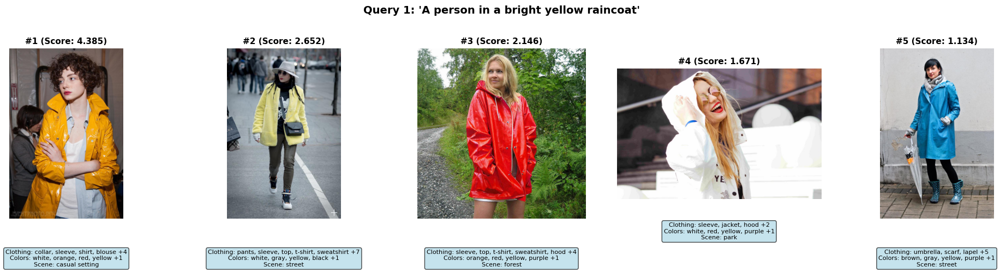


QUERY 2/10: 'Professional business attire inside a modern office'

Top 5 Results:

  1. Score: 5.189
     File: afca385c5605c6ef8341251abd30cc4a.jpg
     Clothing: watch, sleeve, shirt, blouse, collar
     Colors: blue
     Scene: office
     Florence: The image shows a man standing in an office with his hands i...
     BLIP: a fashion photograph of a man standing in an office with his...

  2. Score: 4.934
     File: 7cf836aab94cde732a337bbd969379fb.jpg
     Clothing: lapel, epaulette, belt, sleeve
     Colors: pink
     Scene: office
     Florence: The image shows a woman sitting at a desk in front of a comp...
     BLIP: a fashion photograph of a woman sitting at a desk in front o...

  3. Score: 4.737
     File: 87b1661421abc1c00e3cb3b75b8660cf.jpg
     Clothing: dress, watch, headband, head covering, hair accessory, belt
     Colors: brown, red, gray, purple, black
     Scene: office
     Florence: The image shows a woman standing in front of a door with a s...
     BLIP: a fashi

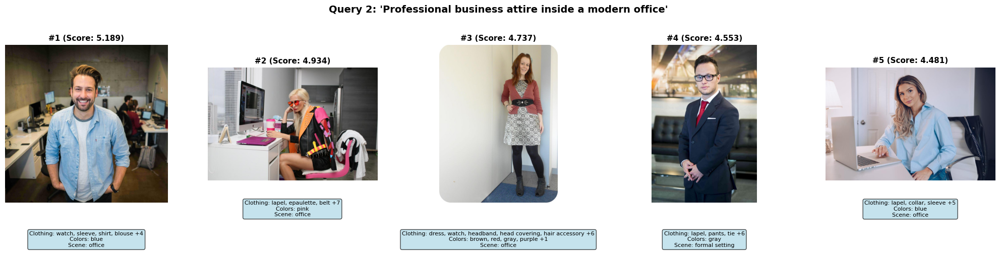


QUERY 3/10: 'Someone wearing a blue shirt sitting on a park bench'

Top 5 Results:

  1. Score: 6.918
     File: 437938cf10878ca586fb7efd27b05de8.jpg
     Clothing: dress, scarf, watch, shoe
     Colors: green
     Scene: casual setting
     Florence: The image shows a woman sitting on a bench in a park, wearin...
     BLIP: a fashion photograph of a woman sitting on a blue bench...

  2. Score: 6.833
     File: d1d6e4ab99ce7fa5e600c2f3079edd98.jpg
     Clothing: sleeve, top, t-shirt, sweatshirt, shoe, neckline
     Colors: white, gray, purple, black, blue
     Scene: park
     Florence: The image shows a woman sitting on top of a bench next to a ...
     BLIP: a fashion photograph of a young woman sitting on a bench...

  3. Score: 6.818
     File: 2e78e78da2e8909b520546fd99e455fd.jpg
     Clothing: sock, sleeve, top, t-shirt, sweatshirt, shoe
     Colors: red, gray, purple, black, blue
     Scene: park
     Florence: The image shows a woman sitting on a bench in a park, wearin...
  

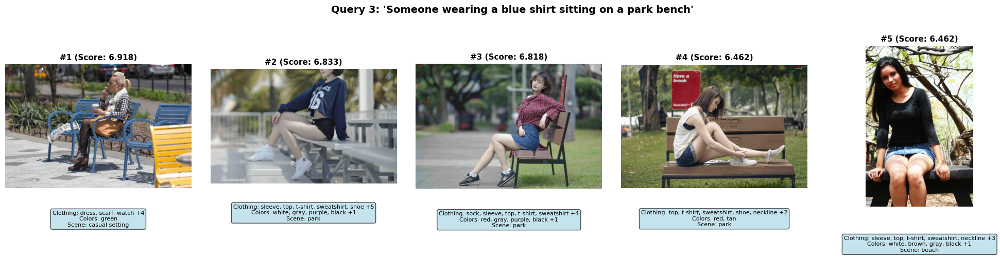


QUERY 4/10: 'Casual weekend outfit for a city walk'

Top 5 Results:

  1. Score: 2.790
     File: 2f09f0936305676937f01f9b4af092f9.jpg
     Clothing: lapel, pants, sleeve, top, t-shirt, sweatshirt
     Colors: brown, gray, white
     Scene: casual setting
     Florence: The image shows a woman standing on the street wearing a gre...
     BLIP: a fashion photograph of a woman walking down a city street...

  2. Score: 2.577
     File: e8841e3fb4bdf4886f07ae96e59760cf.jpg
     Clothing: pants, sleeve, top, t-shirt, sweatshirt, shoe
     Colors: tan, white, brown, gray, pink
     Scene: street
     Florence: The image shows a woman walking down the street in a black a...
     BLIP: a fashion photograph of a woman walking down a city street...

  3. Score: 2.446
     File: 5eec0f3ec3ca2bf42b0ca230b5e24775.jpg
     Clothing: pants, sleeve, collar, top, t-shirt, sweatshirt
     Colors: purple, tan
     Scene: street
     Florence: The image shows a woman walking down the street in front of 

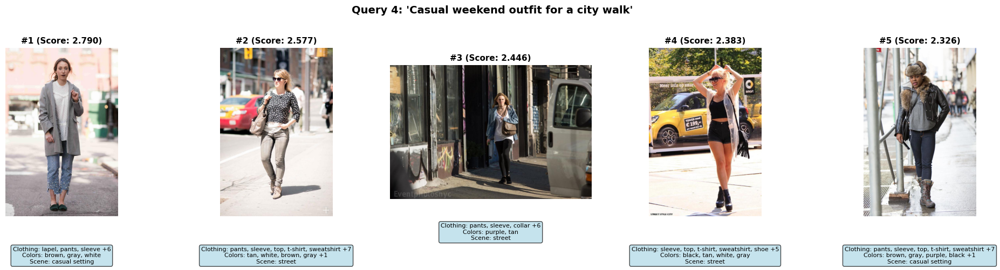


QUERY 5/10: 'A red tie and a white shirt in a formal setting'

Top 5 Results:

  1. Score: 6.671
     File: 57ec45d24c84722c723f9aab64cafdcb.jpg
     Clothing: lapel, tie, shirt, blouse, collar
     Colors: white, brown, red, gray, purple
     Scene: formal setting
     Florence: The image shows a woman standing in front of a wall wearing ...
     BLIP: a fashion photograph of a woman wearing a suit and red tie...

  2. Score: 6.670
     File: 2f95e4ae621fff9a8bbfb3ce56ea5907.jpg
     Clothing: watch, pants, belt, tie
     Colors: white, orange, brown, red, gray
     Scene: urban
     Florence: The image shows a man in a white shirt and red tie standing ...
     BLIP: a fashion photograph of a young man in a white shirt and red...

  3. Score: 5.954
     File: bfff250682154ef4651f5d74597f2936.jpg
     Clothing: lapel, pants, tie, belt
     Colors: orange, brown, red, gray, blue
     Scene: casual setting
     Florence: The image shows a man in a blue blazer, white shirt, red tie...
  

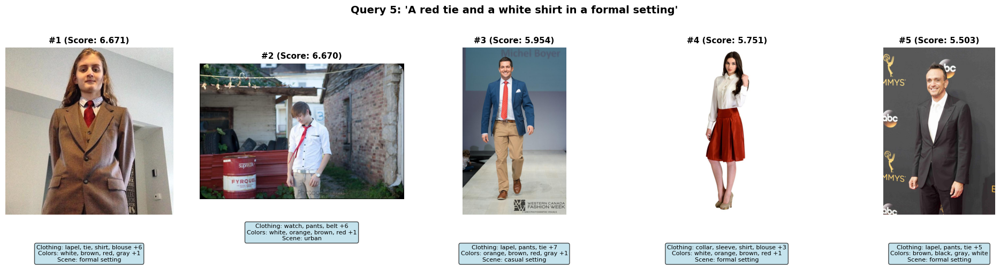


QUERY 6/10: 'Black leather jacket with blue jeans'

Top 5 Results:

  1. Score: 6.012
     File: b30850f3899b060c01dfa81245266d24.jpg
     Clothing: pants, collar, sleeve, top, t-shirt, sweatshirt
     Colors: blue
     Scene: street
     Florence: The image shows a woman walking down the street in a black l...
     BLIP: a fashion photograph of a woman walking down a city street...

  2. Score: 5.955
     File: eb2c0ef1bc31b58ae929e1467275aeb9.jpg
     Clothing: epaulette, pants, sleeve, collar
     Colors: orange, brown, gray, black, blue
     Scene: casual setting
     Florence: The image shows a man in a black leather jacket and black pa...
     BLIP: a fashion photograph of a male model in a black leather jack...

  3. Score: 5.804
     File: f4d58405bd7a6f193e317c0b6246e562.jpg
     Clothing: lapel, pants, sleeve, top, t-shirt, sweatshirt
     Colors: purple, brown, green, blue
     Scene: countryside
     Florence: The image shows a woman in a black leather jacket and pants ...

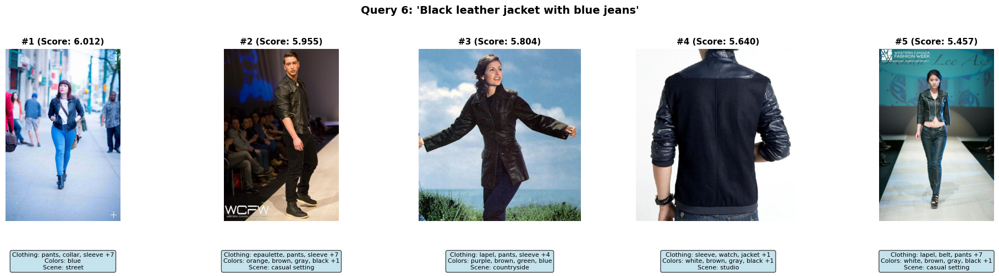


QUERY 7/10: 'Woman in elegant evening dress'

Top 5 Results:

  1. Score: 5.860
     File: aaffd5847f638c8863a226c3cd47de99.jpg
     Clothing: dress, neckline, applique, shoe
     Colors: white, red, purple, black, blue
     Scene: formal setting
     Florence: The image shows a woman in a stunning blue strapless evening...
     BLIP: a fashion photograph of a woman in a blue dress posing for a...

  2. Score: 5.763
     File: 4af36c21c83e2676824e199e05a9ae3a.jpg
     Clothing: dress, neckline, sleeve, bead
     Colors: black, purple, red
     Scene: formal setting
     Florence: The image shows a woman in a stunning burgundy evening dress...
     BLIP: a fashion photograph of a woman in a red dress posing for a ...

  3. Score: 5.710
     File: eb5f5be395fdd9253312d39d81684b19.jpg
     Clothing: dress, neckline, headband, head covering, hair accessory, bead
     Colors: red, gray, purple, black, blue
     Scene: formal setting
     Florence: The image shows a woman in a stunning roya

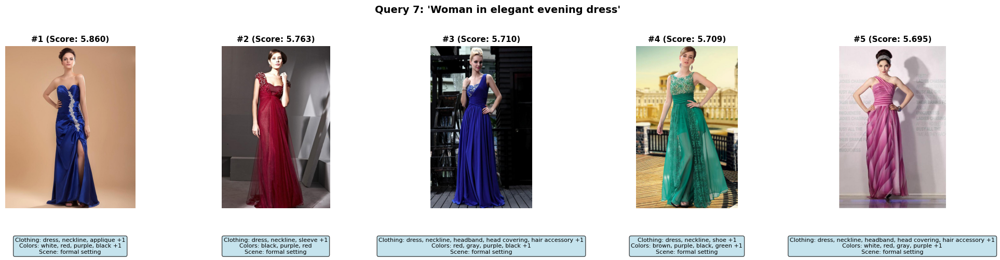


QUERY 8/10: 'Man wearing white sneakers and gray sweatpants'

Top 5 Results:

  1. Score: 6.008
     File: 426692c0bbed8b55f5b843e2c9aed76c.jpg
     Clothing: pants, belt, shoe, pocket
     Colors: white, brown, gray, purple, black
     Scene: casual setting
     Florence: The image shows a man standing in front of a white backgroun...
     BLIP: a fashion photograph of a man in a white t - shirt and grey ...

  2. Score: 5.990
     File: 63b10fd83dbdde73050a46138401c08b.jpg
     Clothing: pants, collar, sleeve, shoe
     Colors: tan, brown, gray, purple, black, blue
     Scene: casual setting
     Florence: The image shows a man with a long white beard wearing a blac...
     BLIP: a fashion photograph of a man with a white beard and a black...

  3. Score: 5.857
     File: 86a4f29abc052eecfc0b3b07bdea9854.jpg
     Clothing: watch, pants, sleeve, collar
     Colors: gray
     Scene: casual setting
     Florence: The image shows a man in a black tracksuit and white sneaker...
     BLIP

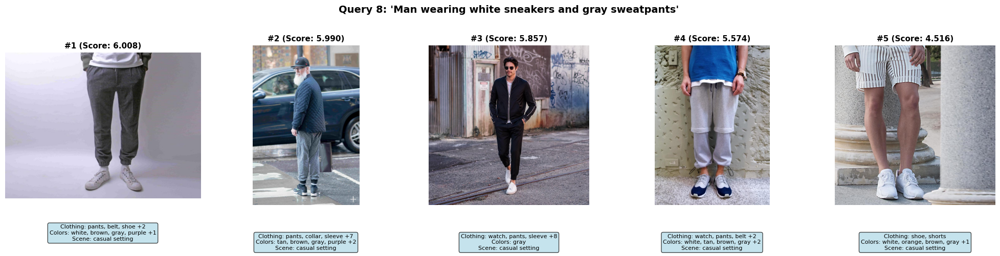


QUERY 9/10: 'Pink floral summer dress outdoors'

Top 5 Results:

  1. Score: 4.161
     File: 734dac074f5a858453c5a5b636ea98ab.jpg
     Clothing: jumpsuit, neckline, sleeve
     Colors: red, purple, black, green, pink
     Scene: outdoor
     Florence: The image shows a woman in a black floral dress walking down...
     BLIP: a fashion photograph of a woman walking down a runway in a f...

  2. Score: 4.054
     File: 341b86e6d7b956bcdd708239d7e8d137.jpg
     Clothing: dress, scarf, shoe, bag, wallet
     Colors: purple, pink
     Scene: outdoor
     Florence: The image shows a woman in a floral dress walking down a run...
     BLIP: a fashion photograph of a woman in a floral dress walking do...

  3. Score: 3.840
     File: 3a224df61cfb4a1a5fd478e2be6ee3e9.jpg
     Clothing: dress, belt, sleeve, bag, wallet
     Colors: gray, purple, black, blue, pink
     Scene: outdoor
     Florence: The image shows a woman wearing a navy floral off the should...
     BLIP: a fashion photograph of

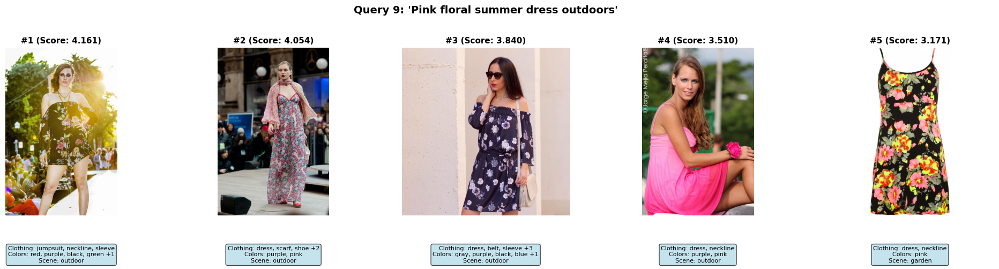


QUERY 10/10: 'Formal suit at a wedding ceremony'

Top 5 Results:

  1. Score: 2.458
     File: bfbea1e82543fd88d0f04dd0020f0f85.jpg
     Clothing: dress, neckline
     Colors: white
     Scene: formal setting
     Florence: The image shows a woman in a white wedding dress and a man i...
     BLIP: a fashion photograph of a woman in a wedding dress and a man...

  2. Score: 1.767
     File: ff349939e98daf578eeb2d0480bf62db.jpg
     Clothing: lapel, pants, tie, sleeve
     Colors: brown, gray
     Scene: wedding
     Florence: The image shows a man in a brown suit leaning against a wood...
     BLIP: a fashion photograph of a man in a suit leaning against a do...

  3. Score: 0.751
     File: 9dbaee78a9fa58b6c9795ad095bc95a8.jpg
     Clothing: dress, applique, neckline, headband, head covering, hair accessory
     Colors: brown, white, pink
     Scene: formal setting
     Florence: The image shows a woman in a beautiful wedding dress standin...
     BLIP: a fashion photograph of a woman

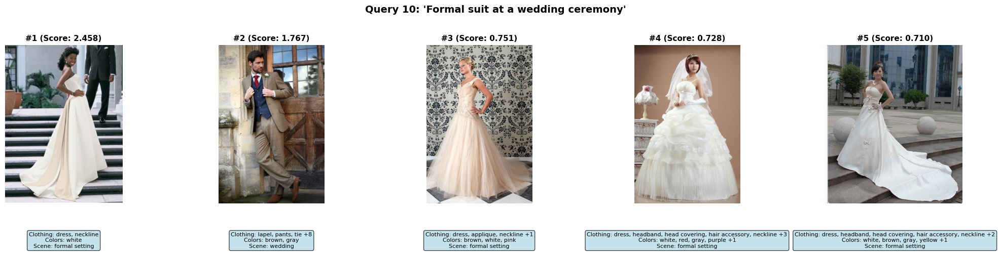


VISUAL STYLE SIMILARITY TEST (SEARCH BY IMAGE)
Query Image: cc6a7763ebae9d50993b8eba604db2c1.jpg


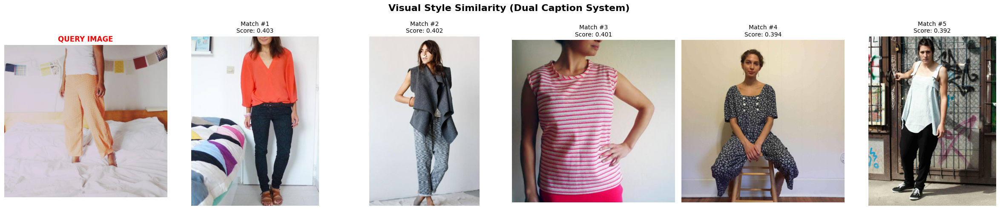


[10/11] Generating evaluation summary...

📊 DUAL CAPTION SYSTEM STATISTICS:
  Images Indexed: 20000
  Total Queries: 10
  Average Top-1 Score: 5.045
  Average Top-5 Score: 4.463
  Positive Scores: 10/10 (100.0%)
  Result Color Coverage: 100.0%

📋 CAPTION STATISTICS:
  Florence-2 Captions: 20000 (100.0%)
  BLIP Captions: 20000 (100.0%)
  Visual Colors: 19997 (100.0%)

📋 QUERY BREAKDOWN:
   1. [✓]   4.38 | Colors: ✓ | A person in a bright yellow raincoat
   2. [✓]   5.19 | Colors: ✓ | Professional business attire inside a modern offic
   3. [✓]   6.92 | Colors: ✓ | Someone wearing a blue shirt sitting on a park ben
   4. [✓]   2.79 | Colors: ✓ | Casual weekend outfit for a city walk
   5. [✓]   6.67 | Colors: ✓ | A red tie and a white shirt in a formal setting
   6. [✓]   6.01 | Colors: ✓ | Black leather jacket with blue jeans
   7. [✓]   5.86 | Colors: ✓ | Woman in elegant evening dress
   8. [✓]   6.01 | Colors: ✓ | Man wearing white sneakers and gray sweatpants
   9. [✓]   4.16 | Col

In [14]:
"""
COMPLETE DUAL CAPTION PIPELINE
Florence-2 + BLIP + Color Detection + All Improvements
"""

import gc
import shutil
import numpy as np
import json
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

print("="*80)
print("DUAL CAPTION FASHION SEARCH - FLORENCE-2 + BLIP")
print("="*80)

# ============================================================================
# STEP 1: Clean up
# ============================================================================
print("\n[1/11] Cleaning up...")

for var_name in ['retriever', 'db', 'encoder', 'color_detector', 'blip_captioner']:
    if var_name in globals():
        try:
            obj = globals()[var_name]
            if hasattr(obj, 'db') and hasattr(obj.db, 'client'):
                obj.db.client.close()
            elif hasattr(obj, 'client'):
                obj.client.close()
            del globals()[var_name]
        except:
            pass

gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

if VECTOR_DB_DIR.exists():
    shutil.rmtree(VECTOR_DB_DIR)
VECTOR_DB_DIR.mkdir(parents=True, exist_ok=True)

print("✓ Cleanup complete")


# ============================================================================
# STEP 2: Initialize BLIP Captioner
# ============================================================================
print("\n[2/11] Initializing BLIP captioner...")

blip_captioner = BLIPCaptioner(device=DEVICE)

if blip_captioner.active:
    print("✓ BLIP ready - will use BOTH Florence-2 AND BLIP!")
else:
    print("⚠️ BLIP not available - will use Florence-2 only")


# ============================================================================
# STEP 3: Initialize Visual Color Detector
# ============================================================================
print("\n[3/11] Initializing visual color detector...")

color_detector = VisualColorDetector(device=DEVICE)
print("✓ Color detector ready")


# ============================================================================
# STEP 4: Load dataset with DUAL CAPTIONS + Color Detection
# ============================================================================
print("\n[4/11] Loading dataset with Florence-2 + BLIP + Color Detection...")
print("  This will take longer but provides richer metadata")

loader = DualCaptionFashionpediaLoader(
    TRAIN_ANNOTATIONS,
    TRAIN_IMG_DIR,
    max_images=20000,  # Increase to 20k-30k for production
    color_detector=color_detector,
    florence_model=florence_model,
    florence_processor=florence_processor,
    blip_captioner=blip_captioner
)

metadata_list = loader.get_all_metadata()
print(f"✓ Loaded {len(metadata_list)} images")

# Calculate statistics
with_florence = sum(1 for m in metadata_list if hasattr(m, 'florence_caption') and m.florence_caption)
with_blip = sum(1 for m in metadata_list if hasattr(m, 'blip_caption') and m.blip_caption)
with_colors = sum(1 for m in metadata_list if m.colors)

print(f"  Florence captions: {with_florence}/{len(metadata_list)} ({with_florence/len(metadata_list)*100:.1f}%)")
print(f"  BLIP captions: {with_blip}/{len(metadata_list)} ({with_blip/len(metadata_list)*100:.1f}%)")
print(f"  Color metadata: {with_colors}/{len(metadata_list)} ({with_colors/len(metadata_list)*100:.1f}%)")


# ============================================================================
# STEP 5: Generate embeddings with DUAL CAPTIONS
# ============================================================================
print("\n[5/11] Generating embeddings with dual caption support...")

encoder = DualCaptionEncoder(device=DEVICE)
embeddings_list = encoder.encode_batch(metadata_list, batch_size=BATCH_SIZE)

# Check what we have
has_florence_emb = sum(1 for e in embeddings_list if 'florence' in e)
has_blip_emb = sum(1 for e in embeddings_list if 'blip' in e)

print(f"✓ Generated {len(embeddings_list)} embeddings")
print(f"  With Florence embeddings: {has_florence_emb}")
print(f"  With BLIP embeddings: {has_blip_emb}")


# ============================================================================
# STEP 6: Save everything
# ============================================================================
print("\n[6/11] Saving dual-caption data...")

embeddings_path = EMBEDDINGS_DIR / "train_embeddings_dual.npy"
np.save(embeddings_path, embeddings_list)
print(f"✓ Embeddings: {embeddings_path.stat().st_size / (1024*1024):.2f} MB")

metadata_output = PROCESSED_DATA_DIR / "train_metadata_dual.json"
loader.save_metadata(metadata_list, metadata_output)
print(f"✓ Metadata: {metadata_output}")


# ============================================================================
# STEP 7: Build dual-caption vector database
# ============================================================================
print("\n[7/11] Building dual-caption vector database...")

db = dual_caption_build_index(metadata_list, embeddings_list, recreate=True)
info = db.get_collection_info()
print(f"✓ Database built: {info['points_count']} images")

db.client.close()
del db
gc.collect()


# ============================================================================
# STEP 8: Initialize dual-caption retriever
# ============================================================================
print("\n[8/11] Initializing dual-caption retriever...")

retriever = DualCaptionRetriever(
    db_path=VECTOR_DB_DIR,
    device=DEVICE,
    use_reranking=True
)

print("✓ Dual-caption retriever ready!")


# ============================================================================
# STEP 9: Run comprehensive evaluation
# ============================================================================
print("\n[9/11] Running comprehensive evaluation...")

evaluation_queries = [
    "A person in a bright yellow raincoat",
    "Professional business attire inside a modern office",
    "Someone wearing a blue shirt sitting on a park bench",
    "Casual weekend outfit for a city walk",
    "A red tie and a white shirt in a formal setting",
    "Black leather jacket with blue jeans",
    "Woman in elegant evening dress",
    "Man wearing white sneakers and gray sweatpants",
    "Pink floral summer dress outdoors",
    "Formal suit at a wedding ceremony"
]

all_results = {}

for query_idx, query in enumerate(evaluation_queries, 1):
    print(f"\n{'='*80}")
    print(f"QUERY {query_idx}/{len(evaluation_queries)}: '{query}'")
    print('='*80)
    
    results = retriever.search_advanced(query, top_k=5)
    all_results[query] = results
    
    print(f"\nTop 5 Results:")
    for i, result in enumerate(results, 1):
        print(f"\n  {i}. Score: {result['score']:.3f}")
        print(f"     File: {result['file_name']}")
        print(f"     Clothing: {', '.join(result['clothing_items'][:4])}")
        print(f"     Colors: {', '.join(result['colors'][:6])}")
        print(f"     Scene: {result['scene']}")
        
        # Show captions if available
        if result.get('florence_caption'):
            print(f"     Florence: {result['florence_caption'][:60]}...")
        if result.get('blip_caption'):
            print(f"     BLIP: {result['blip_caption'][:60]}...")
    
    # Visualize
    num_display = min(5, len(results))
    fig, axes = plt.subplots(1, num_display, figsize=(4*num_display, 5))
    
    if num_display == 1:
        axes = [axes]
    
    fig.suptitle(f"Query {query_idx}: '{query}'", fontsize=14, fontweight='bold', y=1.02)
    
    for idx, (ax, result) in enumerate(zip(axes, results[:num_display])):
        try:
            img = Image.open(result['file_path'])
            ax.imshow(img)
            ax.set_title(f"#{idx+1} (Score: {result['score']:.3f})", 
                        fontsize=11, fontweight='bold')
            
            metadata_lines = []
            if result['clothing_items']:
                clothing_str = ', '.join(result['clothing_items'][:3])
                if len(result['clothing_items']) > 3:
                    clothing_str += f" +{len(result['clothing_items'])-3}"
                metadata_lines.append(f"Clothing: {clothing_str}")
            
            if result['colors']:
                color_str = ', '.join(result['colors'][:4])
                if len(result['colors']) > 4:
                    color_str += f" +{len(result['colors'])-4}"
                metadata_lines.append(f"Colors: {color_str}")
            
            if result['scene']:
                metadata_lines.append(f"Scene: {result['scene']}")
            
            metadata_text = '\n'.join(metadata_lines)
            ax.text(0.5, -0.18, metadata_text, transform=ax.transAxes, 
                   fontsize=8, ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
            
        except:
            pass
        
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()


# NEW: Visual Style Similarity Test
print("\n" + "="*80)
print("VISUAL STYLE SIMILARITY TEST (SEARCH BY IMAGE)")
print("="*80)

import random
sample_img_id = random.choice(list(loader.images.keys()))
query_img_path = loader.image_dir / loader.images[sample_img_id]['file_name']

print(f"Query Image: {query_img_path.name}")
style_results = retriever.search_by_image(str(query_img_path), top_k=5)

fig, axes = plt.subplots(1, 6, figsize=(24, 5))
axes[0].imshow(Image.open(query_img_path))
axes[0].set_title("QUERY IMAGE", fontweight='bold', color='red', fontsize=12)
axes[0].axis('off')

for i, (ax, res) in enumerate(zip(axes[1:], style_results)):
    ax.imshow(Image.open(res['file_path']))
    ax.set_title(f"Match #{i+1}\nScore: {res['score']:.3f}", fontsize=10)
    ax.axis('off')

plt.suptitle("Visual Style Similarity (Dual Caption System)", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


# ============================================================================
# STEP 10: Generate comprehensive statistics
# ============================================================================
print("\n[10/11] Generating evaluation summary...")

total_queries = len(evaluation_queries)
avg_top1_score = np.mean([results[0]['score'] for results in all_results.values()])
avg_top5_score = np.mean([np.mean([r['score'] for r in results[:5]]) 
                          for results in all_results.values()])

# Positive scores
positive_scores = sum(1 for results in all_results.values() if results[0]['score'] > 0)
positive_pct = (positive_scores / total_queries * 100)

# Color coverage in results
total_results_with_colors = sum(
    1 for results in all_results.values()
    for result in results[:5]
    if result.get('colors')
)
total_results = sum(len(results[:5]) for results in all_results.values())
result_color_coverage = (total_results_with_colors / total_results * 100) if total_results > 0 else 0

print(f"\n📊 DUAL CAPTION SYSTEM STATISTICS:")
print(f"  Images Indexed: {len(metadata_list)}")
print(f"  Total Queries: {total_queries}")
print(f"  Average Top-1 Score: {avg_top1_score:.3f}")
print(f"  Average Top-5 Score: {avg_top5_score:.3f}")
print(f"  Positive Scores: {positive_scores}/{total_queries} ({positive_pct:.1f}%)")
print(f"  Result Color Coverage: {result_color_coverage:.1f}%")

print(f"\n📋 CAPTION STATISTICS:")
print(f"  Florence-2 Captions: {with_florence} ({with_florence/len(metadata_list)*100:.1f}%)")
print(f"  BLIP Captions: {with_blip} ({with_blip/len(metadata_list)*100:.1f}%)")
print(f"  Visual Colors: {with_colors} ({with_colors/len(metadata_list)*100:.1f}%)")

print(f"\n📋 QUERY BREAKDOWN:")
for i, query in enumerate(evaluation_queries, 1):
    results = all_results[query]
    top1_score = results[0]['score']
    has_colors = "✓" if results[0].get('colors') else "✗"
    status = "✓" if top1_score > 0 else "✗"
    print(f"  {i:2d}. [{status}] {top1_score:6.2f} | Colors: {has_colors} | {query[:50]}")


# ============================================================================
# STEP 11: Save final results
# ============================================================================
print("\n[11/11] Saving final results...")

eval_results = {
    'timestamp': str(pd.Timestamp.now()),
    'configuration': {
        'num_images': len(metadata_list),
        'captioning': 'Florence-2 + BLIP (Dual)',
        'color_detection': 'CLIP-based visual',
        'reranking': True
    },
    'statistics': {
        'num_queries': total_queries,
        'avg_top1_score': float(avg_top1_score),
        'avg_top5_score': float(avg_top5_score),
        'positive_score_pct': float(positive_pct),
        'result_color_coverage_pct': float(result_color_coverage),
        'florence_caption_pct': float(with_florence/len(metadata_list)*100),
        'blip_caption_pct': float(with_blip/len(metadata_list)*100)
    },
    'improvements': [
        'Dual captioning (Florence-2 + BLIP)',
        'Visual color detection (CLIP)',
        'Multi-attribute search vectors',
        'Smart query-adaptive weights',
        'Color match bonus/penalty system',
        'Improved reranker with dual captions',
        'Visual style similarity search'
    ],
    'queries': {}
}

for query, results in all_results.items():
    eval_results['queries'][query] = {
        'top_5_results': [
            {
                'rank': i+1,
                'file_name': r['file_name'],
                'score': float(r['score']),
                'clothing_items': r['clothing_items'],
                'colors': r['colors'],
                'scene': r['scene'],
                'florence_caption': r.get('florence_caption', ''),
                'blip_caption': r.get('blip_caption', '')
            }
            for i, r in enumerate(results[:5])
        ]
    }

eval_file = OUTPUT_DIR / "evaluation_results_dual.json"
with open(eval_file, 'w') as f:
    json.dump(eval_results, f, indent=2)

state_file = OUTPUT_DIR / "system_state_dual.json"
with open(state_file, 'w') as f:
    json.dump({
        'database_path': str(VECTOR_DB_DIR),
        'embeddings_path': str(embeddings_path),
        'metadata_path': str(metadata_output),
        'num_images': len(metadata_list),
        'version': 'dual_caption_florence_blip',
        'timestamp': str(pd.Timestamp.now())
    }, f, indent=2)

print(f"✓ Results saved:")
print(f"  - {eval_file}")
print(f"  - {state_file}")


# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("\n" + "="*80)
print("✓✓✓ DUAL CAPTION SYSTEM COMPLETE ✓✓✓")
print("="*80)

print("\n🎯 DUAL CAPTION CONFIGURATION:")
print(f"  • Dataset: {len(metadata_list)} images")
print(f"  • Captioning: Florence-2 + BLIP (both)")
print(f"  • Color detection: CLIP-based visual")
print(f"  • Search vectors: 7 (global, clothing, color, scene, style, florence, blip)")
print(f"  • Reranking: Enabled with dual captions")

print("\n📊 COVERAGE METRICS:")
print(f"  • Florence captions: {with_florence/len(metadata_list)*100:.1f}%")
print(f"  • BLIP captions: {with_blip/len(metadata_list)*100:.1f}%")
print(f"  • Visual colors: {with_colors/len(metadata_list)*100:.1f}%")
print(f"  • Result color coverage: {result_color_coverage:.1f}%")

print("\n📈 PERFORMANCE:")
print(f"  • Average Top-1 Score: {avg_top1_score:.3f}")
print(f"  • Positive Scores: {positive_pct:.1f}%")

print("\n💡 USAGE:")
print("  # Text search")
print("  results = retriever.search_advanced('yellow raincoat', top_k=10)")
print("  ")
print("  # Visual similarity search")
print("  matches = retriever.search_by_image('path/to/image.jpg', top_k=10)")
print("  ")
print("  # Visualization")
print("  visualize_results('your query', results)")

print("\n🚀 BENEFITS OF DUAL CAPTIONS:")
print("  ✓ Florence-2: Detailed fashion-specific descriptions")
print("  ✓ BLIP: Natural language descriptions")
print("  ✓ Combined: Richer semantic understanding")
print("  ✓ Reranker: Uses BOTH captions for better ranking")
print("  ✓ More robust: If one model fails, other compensates")

print("\n" + "="*80)